                                                                                         Marta Granero i Martí
                                                                         
# Tercerca lista - Problema individual 3

## Eso es un siete o un nueve, ¿o quizás un cuatro?

### Parece haber una obsesión con conjuntos de datos que representan dígitos escritos a mano. Esto tiene una explicación sencilla. Uno de los primeros retos del OCR fue el reconocimiento de códigos postales en cartas. El clasificar cartas a mano consume demasiado tiempo y no es completamente fiable(además de ser muy aburrido), por lo que tener un sistema eficiente para clasificar el correo era un problema interesante. Uno de los conjuntos de datos más conocidos es MNIST digits. Vamos a utilizar una parte de este conjunto de datos, en concreto un subconjunto de los dígitos, 4, 7 y 9, para experimentar con varios clasificadores. Podéis obtenerlos mediante la función $\texttt{load\_MNIST}$ de la librería $\texttt{apafib}$. Esta función retornará cuatro matrices de datos, el conjunto de entrenamiento y sus etiquetas y el conjunto de test y sus etiquetas. Resuelve los siguientes apartados ilustrando los resultados de la manera que te parezca más adecuada.

In [1]:
#!pip install apafib --upgrade --user --quiet
#!pip install pandas==0.24.2 --upgrade --user

In [2]:
import apafib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels as sm

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.metrics import  ConfusionMatrixDisplay,classification_report,\
                             RocCurveDisplay, PrecisionRecallDisplay,\
                             accuracy_score, f1_score, precision_score, recall_score

from sklearn.model_selection import cross_val_score
from sklearn import set_config

from sklearn.preprocessing import MinMaxScaler, StandardScaler, Binarizer
from sklearn.decomposition import PCA

from statsmodels.genmod.generalized_linear_model import GLM

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import BernoulliNB, GaussianNB

from sklearn.model_selection import GridSearchCV

from sklearn.neighbors import KNeighborsClassifier
from sklearn.inspection import permutation_importance
from numpy.random import choice

from IPython.display import display, HTML #core.display deprecated
show_html = lambda html: display(HTML(html))

from yellowbrick.target.feature_correlation import feature_correlation
from yellowbrick.classifier import precision_recall_curve
from yellowbrick.classifier.rocauc import roc_auc

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

/Users/mac/Library/Python/3.10/lib/python/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### Exploración previa de los datos

En este problema experimentaremos con distintos clasificadores para ver la capacidad que tiene cada uno a la hora de predecir qué número cualsequiera de los que sigue, 4,7 o 9, es el dígito que se esconde detrás de la imagen codificada en 28x28 píxeles.

#### Cargamos el conjunto de datos desde la librería $\texttt{apafib}$

In [3]:
from apafib import load_MNIST

X_train, X_test, y_train, y_test = apafib.load_MNIST()

#X_train, X_test, y_train, y_test
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

X_train = pd.DataFrame(X_train, columns = np.arange(X_train.shape[1]))
X_test  = pd.DataFrame(X_test, columns = np.arange(X_test.shape[1]))

#me guardo una copia del dataset de entrenamiento y test ya que mostraré los dígitos escritos a mano a partir 
#del dataset y aplicaré transformaciones que modificaran ambos conjuntos
X_train_copia = X_train
X_test_copia = X_test

data_columns = X_train_copia.columns
data_columns = data_columns.values
#print(data_columns)

(4514, 784) (755, 784) (4514,) (755,)


#### Breve información del dataset

Vemos que tanto el conjunto de datos de entrenamiento como el conjunto de test tienen 784 columnas, lo cuál nos indica que cada imagen esta compuesta por 784 píxeles, i.e 28x28 por imagen.

In [4]:
X_train.info(), X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4514 entries, 0 to 4513
Columns: 784 entries, 0 to 783
dtypes: float64(784)
memory usage: 27.0 MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 755 entries, 0 to 754
Columns: 784 entries, 0 to 783
dtypes: float64(784)
memory usage: 4.5 MB


(None, None)

#### Breve estadística descriptiva sobre el conjunto de datos

##### Vemos las columnas son los píxeles (28x28 píxeles=784)

In [5]:
X_train.describe(include='all')

,0,1,2,3,4,5,6,7,8,9,...,774,775,776,777,778,779,780,781,782,783
count,4514.0,4514.0,4514.0,4514.0,4514.0,4514.0,4514.0,4514.0,4514.0,4514.0,...,4514.000000,4514.000000,4514.000000,4514.000000,4514.000000,4514.0,4514.0,4514.0,4514.0,4514.0
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.002261,0.000808,0.000657,0.000089,0.000134,0.0,0.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.040297,0.024357,0.022564,0.004127,0.008989,0.0,0.0,0.0,0.0,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.992157,0.996078,0.992157,0.250980,0.603922,0.0,0.0,0.0,0.0,0.0


#### Vemos cúantos ejemplos tenemos de cada clase en nuestro conjunto de entrenamiento

In [6]:
exemples = dict(zip(list(y_train),[list(y_train).count(i) for i in list(y_train)]))
exemples

{4: 1426, 9: 1515, 7: 1573}

#### Extraemos las etiquetas de las clase a las que vamos a clasificar los ejemplos

In [7]:
clases = [str(v) for v in sorted(np.unique(y_train))]
clases

['4', '7', '9']

#### Visualización del conjunto de datos

#### Visualizamos algunas imágenes de los dígitos que se esconden detrás del conjunto de datos

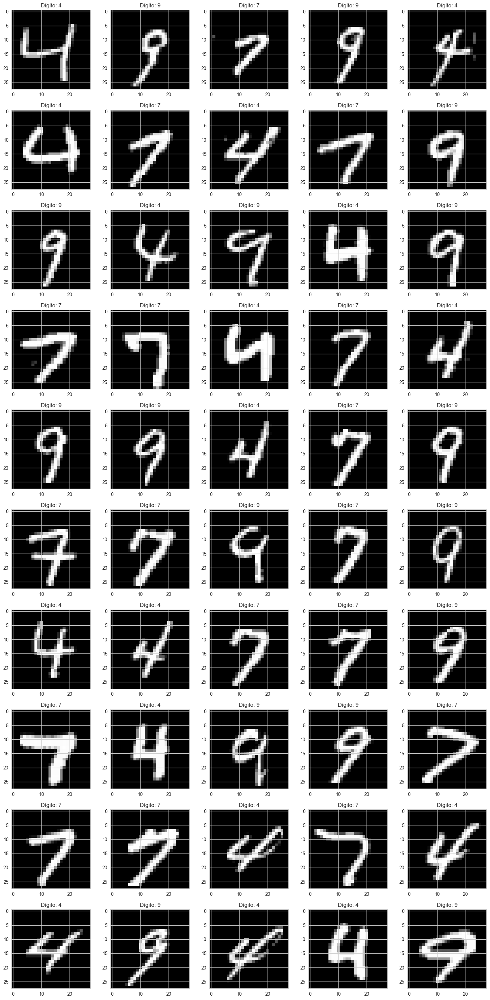

In [8]:
X_train = X_train/255.0
X_test = X_test/255.0

X_train = X_train.values.reshape(-1, 28, 28, 1)
X_test = X_test.values.reshape(-1, 28, 28, 1)

num = 50
num_row = 10
num_col = 5

fig, axes = plt.subplots(num_row, num_col, figsize=(3*num_col,3*num_row))
for i in range(num):
    ax = axes[i//num_col, i%num_col]
    ax.imshow(X_train[:num][i], cmap='gray')
    ax.set_title('Dígito: {}'.format(y_train[:num][i]))
plt.tight_layout()
plt.show()

#### Estandarizamos el conjunto de entrenamiento y test para poder aplicar después el PCA sobre los datos

In [9]:
X_train_standarized = X_train_copia.copy()
scaler = StandardScaler()

X_train_standarized[data_columns] = scaler.fit_transform(X_train_copia[data_columns])
X_train_standarized.describe().T

,count,mean,std,min,25%,50%,75%,max
0,4514.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,4514.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4514.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4514.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4514.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
779,4514.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
780,4514.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
781,4514.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
782,4514.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
X_test_standarized = X_test_copia.copy()

X_test_standarized[data_columns] = scaler.transform(X_test_copia[data_columns])
X_test_standarized.describe().T

,count,mean,std,min,25%,50%,75%,max
0,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
779,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
780,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
781,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
782,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Procedamos con los ejercicios que se nos piden

#### a) Los datos corresponden a imágenes de 28x28 píxeles en niveles de gris. Estos ya están convertidos a vectores y normalizados a la escala [0,1]. Aplica PCA a los datos de entrenamineto y represéntalos en 2D. ¿Se puede ver separabilidad entre las clases? Comenta el resultado

#### El método PCA de scikit-learn devolverá la relación de varianza explicada y todos los parámetros importantes relacionados con PCA

In [11]:
myPCA = PCA().fit(X_train_standarized[data_columns]);

#PCA.explained_variance_ratio_ para comprender qué porcentaje de varianza explican los datos
print(myPCA.explained_variance_ratio_)
print(myPCA.explained_variance_ratio_.cumsum())

[6.90543728e-02 5.24610875e-02 4.03322476e-02 3.23154847e-02
 2.83870232e-02 2.27741208e-02 2.19071911e-02 1.96877134e-02
 1.90347242e-02 1.71893389e-02 1.56047355e-02 1.45276514e-02
 1.37900496e-02 1.32646032e-02 1.23999508e-02 1.21353348e-02
 1.15890818e-02 1.10992701e-02 1.06358841e-02 1.03389630e-02
 9.58733637e-03 9.51724367e-03 9.02038508e-03 8.83374746e-03
 8.59362170e-03 8.37622194e-03 8.12496310e-03 8.02405822e-03
 7.48142391e-03 7.42398565e-03 7.17928357e-03 6.79202219e-03
 6.51528819e-03 6.38826900e-03 6.29264281e-03 6.21910693e-03
 6.02283581e-03 5.80343608e-03 5.71887541e-03 5.52796377e-03
 5.48432752e-03 5.31455740e-03 5.24147258e-03 5.16754080e-03
 5.02292071e-03 4.89488740e-03 4.79032346e-03 4.76303608e-03
 4.64443789e-03 4.53563728e-03 4.48379231e-03 4.39781845e-03
 4.34107974e-03 4.26941348e-03 4.12585686e-03 4.09005431e-03
 4.04515330e-03 3.92051719e-03 3.89486503e-03 3.83886034e-03
 3.78988178e-03 3.72863791e-03 3.67036891e-03 3.65357775e-03
 3.61454905e-03 3.607063

#### Scree plot se usa para comprender la cantidad de componentes principales que se deben usar para capturar la varianza deseada en los datos

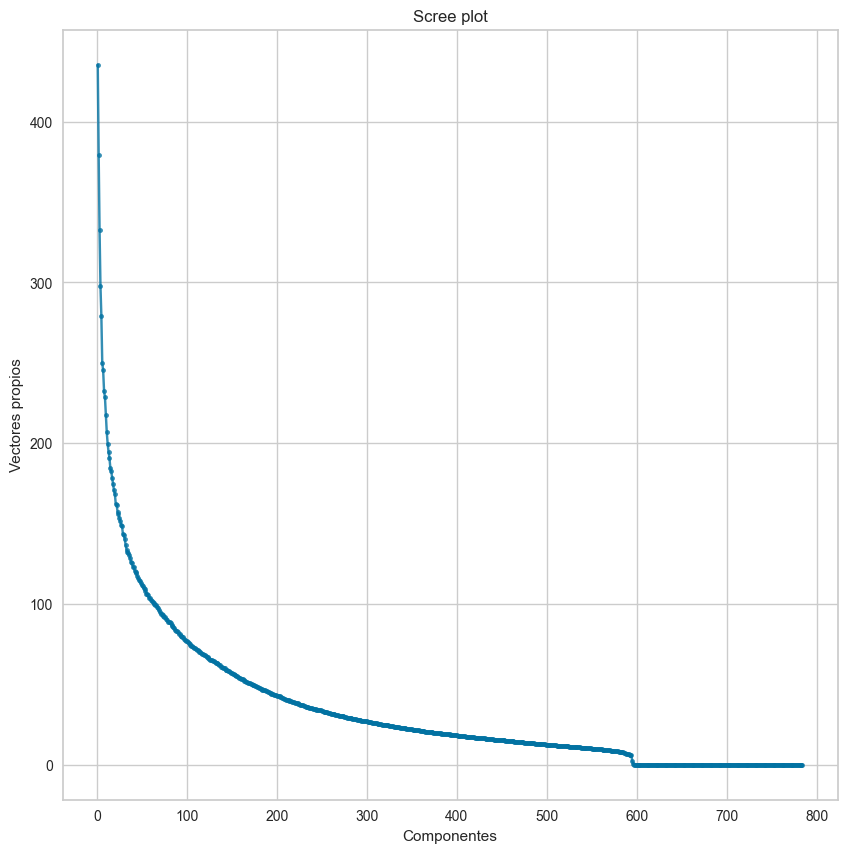

In [12]:
fig = plt.figure(figsize=(10,10));
plt.plot(range(1,len(myPCA.singular_values_ )+1),myPCA.singular_values_ ,alpha=0.8,marker='.');
#La nueva base son los vectores propios de la matriz de covarianza.
y_label = plt.ylabel('Vectores propios');
x_label = plt.xlabel('Componentes');
plt.title('Scree plot');

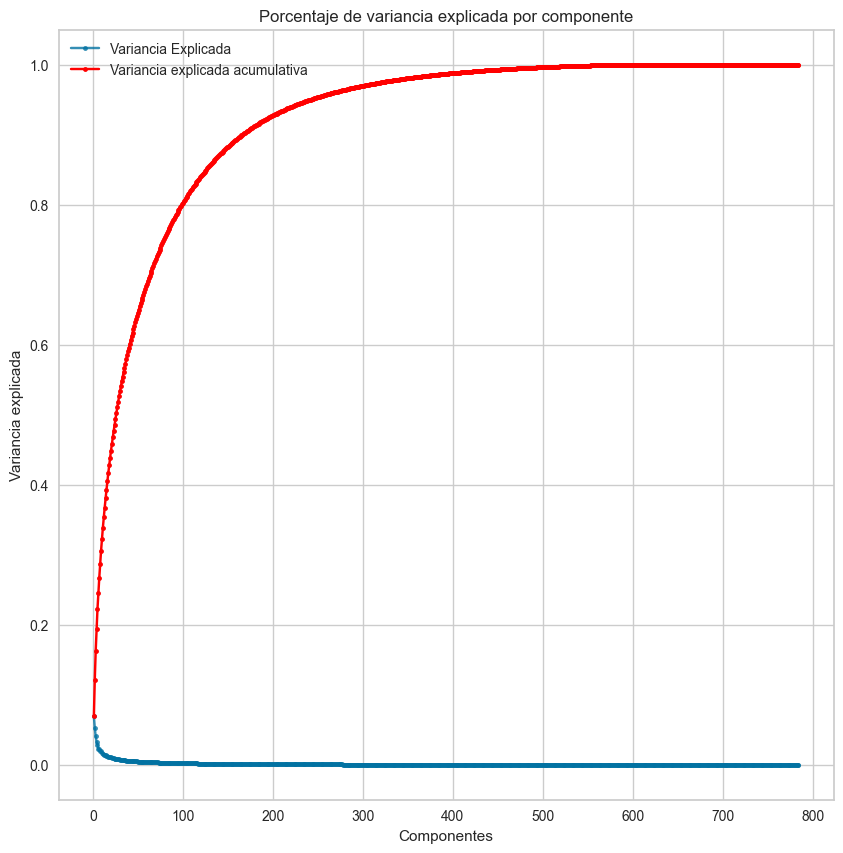

In [13]:
fig = plt.figure(figsize=(10,10));
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),myPCA.explained_variance_ratio_ ,alpha=0.8,marker='.',label="Variancia Explicada");
y_label = plt.ylabel('Variancia explicada');
x_label = plt.xlabel('Componentes');
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),
         np.cumsum(myPCA.explained_variance_ratio_),
         c='red',marker='.',
         label="Variancia explicada acumulativa");
plt.legend();
plt.title('Porcentaje de variancia explicada por componente');

Podemos ver que la variancia explicada acumulada pasa del 85% a partir del aproximadamente 125 componentes, las cien primeras componentes acumulan cerca del 80%. Podemos ver que a pesar del gran número de píxeles que tenemos, usamos relativamente pocos para explicar la varianza de los datos. Ya que una sexta parte de estos nos ayudan a describir más del 85% de la varianza.

##### Pesos que le asigna el PCA a cada componente visualizado con un heatmap

Podemos ver que sí que existen correlaciones entre ciertos píxeles, ya que aparecen fuertes correlaciones entre algunas componentes, como se puede ver en el heatmap. Pero també se puede apreciar que no existen correlaciones entre la gran mayoria de estos.

<AxesSubplot: >

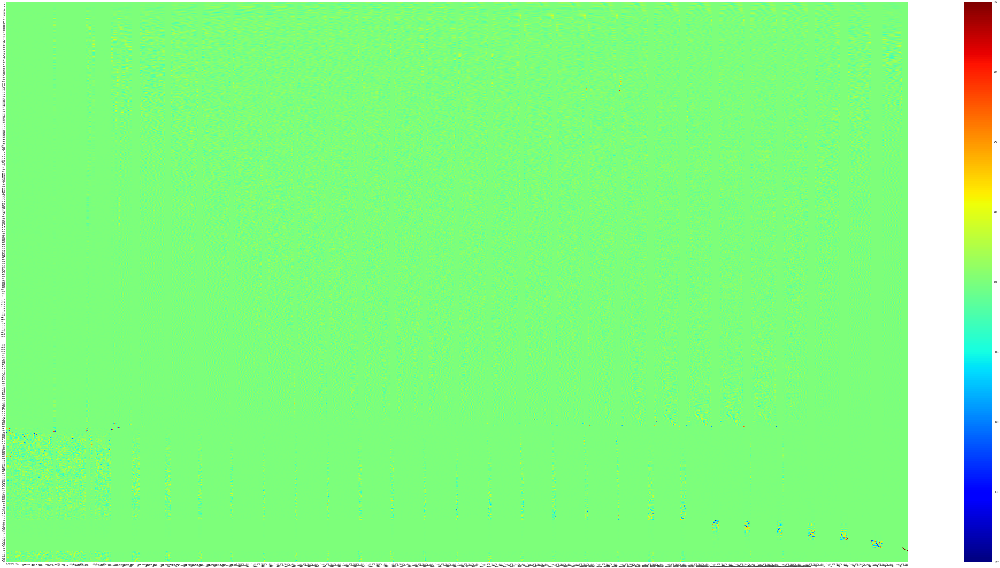

In [14]:
fig, ax = plt.subplots(figsize=(100,50))
sns.heatmap(myPCA.components_, cmap='jet', xticklabels=list(X_train_standarized[X_train_copia.columns]), vmin=-np.max(np.abs(myPCA.components_)), vmax=np.max(np.abs(myPCA.components_)),ax=ax)

#### Transformamos nuestro conjunto de datos utilizando el PCA

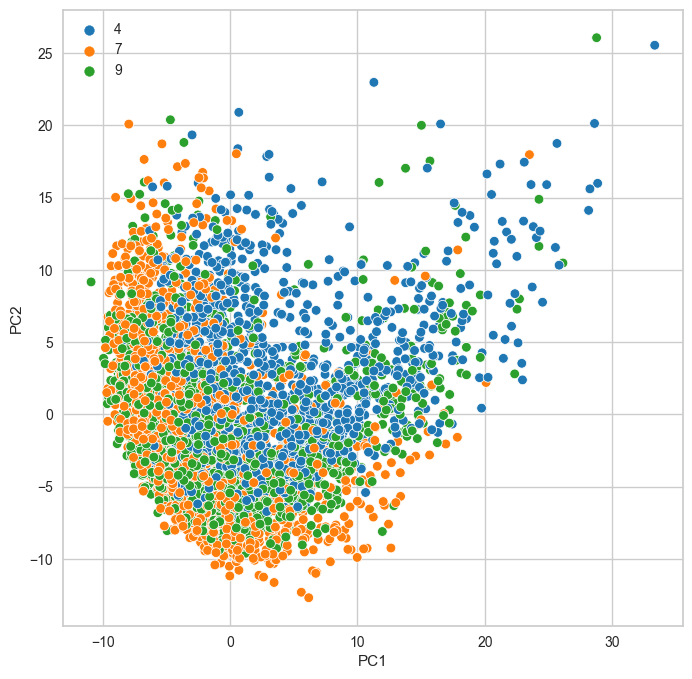

In [15]:
transformed_train = myPCA.transform(X_train_standarized[X_train_copia.columns])
transformed_train

X_train_standarized[['PC1','PC2','PC3']] = transformed_train[:,:3]

fig = plt.figure(figsize=(8,8))
_ = sns.scatterplot(x='PC1', y='PC2', data=X_train_standarized, hue=y_train, palette='tab10')

In [16]:
import plotly.express as px

fig = px.scatter_3d(X_train_standarized, x='PC1', y='PC2', z='PC3',color=y_train)
fig.show()

La verdad és que la separación de clases que se puede ver no es del todo clara, ya que la separabilidad que hace de los tres es bastante confusa. Si que parece hacer casi un buen trabajo para el dígito 4 pero apenas queda muy clara la separación de clases entre los tres. Aunque empieza a intuirse un poco, como podemos ver el 7 queda rodeando al conjunto por el extremo izquierdo y debajo, seguido del dígito 9 más adentro y finalmente los datos que quedan más centrados que pertenecen a la clase del dígito 4. Aún así, parece que no ha terminado de agrupar bien los dígitos en función de su similitud y parace confundirse bastante.   

También vemos bastantes valores outliers que son de la clase del 4 y 9 que se encuentran un poco alejados de donde se encuentran la mayoria de sus respectivos grupos de puntos. Seguramente han sido manuscritos con un formato poco convencional a lo que entendemos por la forma de escribir el 4 y 9. Además, podemos ver que sobretodo para las clases del 7 y 9 la separabilidad es confusa.

Por lo tanto, se ve claro que no podemos decir mucho acerca de la separabilidad y nos es difícil decir si todas son separables. Es por esto que más adelante probaremos a utilitzar el t-SNE para ver si podemos capturar las no linealidades que hay entre los píxeles.

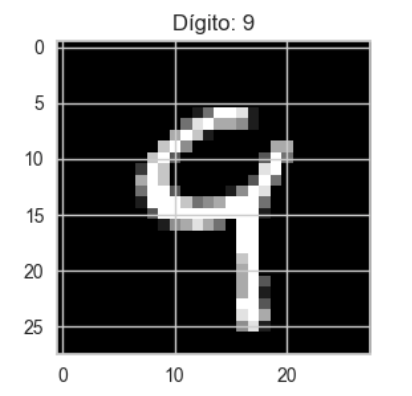

Por ejemplo vemos como este 9 podría confundir al clasificador ya que parece un 4.


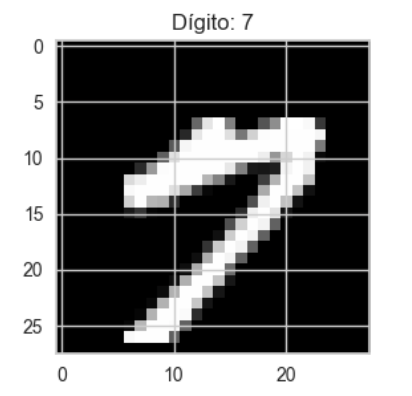
Por ejemplo vemos como este 7 podría confundir al clasificador ya que parece un 9 escrito muy rápido.

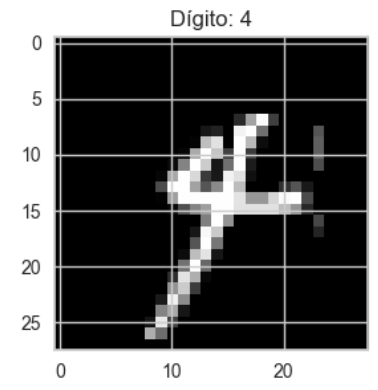

Este 4 un puede ser fácilmente distingido por cualquiera de nosotros, pero alomejor con la colocación de los píxeles podría confundir al clasificador diciendo que es un 9.

#### Vemos como representando los loadings, para el 7 y el 4 sí que a lo mejor nos da la ilusión que se percibe de otra manera su cierta separabilidad.

In [17]:
loadings = myPCA.components_.T * np.sqrt(myPCA.explained_variance_ratio_)

fig = px.scatter(X_train_standarized, x='PC1', y='PC2', color=y_train)

for i, feature in enumerate(X_train_copia.columns):
    fig.add_shape(type='line',x0=0, y0=0,x1=loadings[i, 0],y1=loadings[i, 1])
    fig.add_annotation(x=loadings[i, 0],y=loadings[i, 1],ax=0, ay=0,xanchor="center",yanchor="bottom",text=feature,)
fig.show()

#### Ante esta situación se me ocurre realizar un t-SNE ya que como usa distancias alomejor nos permite tener en cuenta ciertas no linearidades en los datos.

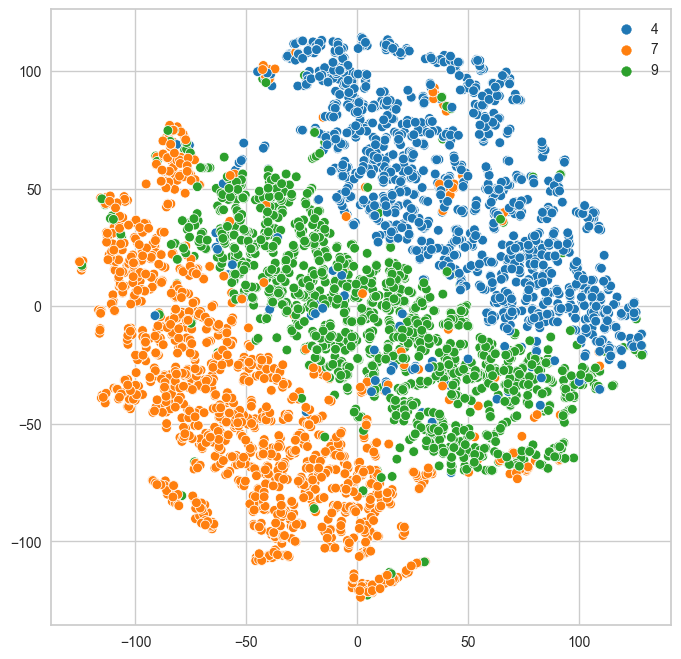

In [18]:
from sklearn.manifold import TSNE

transformed_train = TSNE(n_components=2, perplexity=10, n_iter=2000, init='pca').fit_transform(X_train_standarized[data_columns])

fig = plt.figure(figsize=(8,8))
sns.scatterplot(x=transformed_train[:,0], y=transformed_train[:,1], hue=y_train, palette='tab10');

Esta es una clara visualización de la separabilidad entre clases que esperábamos ya que vemos un patrón de grupos claro auqnue también es cierto que tenemos pequeños grupos de distintas clases de dígitos que parecen agruparse debido a su parecido de escritura. Por lo tanto vemos que el conjunto de datos es ciertamente sencillo de clasificar correctamente al menos con los píxeles que tenemos. t-SNE nos ha podido capturar las no linealidades y nos muestra una clara separación de los tres dígitos.

#### Ante esta separabilidad podemos probar de aplicar un LDA para ver como se comporta el discriminante lineal sobre los datos de entrenamiento y vemos que el acierto del modelo para clasificar los dígitos es bueno. O podríamos probar como se comporta QDA por ejemplo.

In [19]:
lda = LinearDiscriminantAnalysis()
print(np.mean(cross_val_score(lda,X_train_copia,y_train,cv=10)))

0.9164800934010948


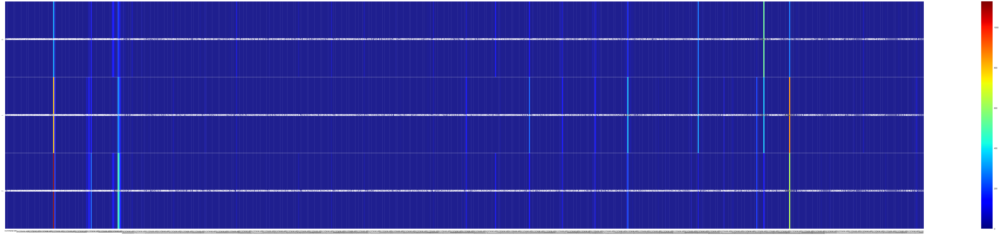

In [20]:
lda_model = LinearDiscriminantAnalysis().fit(X_train_copia, y_train)

coefs = pd.DataFrame(lda_model.coef_)
coefs.columns = data_columns

plt.figure(figsize=(100,20));
sns.heatmap(coefs.abs(), annot=True, linewidths=.5, cbar=True, xticklabels=True, cmap='jet', annot_kws={'size':12});

Podemos ver que ciertos píxeles tienen un peso importante en el modelo.

In [21]:
print(classification_report(lda_model.predict(X_test_copia), y_test))

              precision    recall  f1-score   support

           4       0.90      0.94      0.92       239
           7       0.91      0.94      0.92       241
           9       0.92      0.85      0.88       275

    accuracy                           0.91       755
   macro avg       0.91      0.91      0.91       755
weighted avg       0.91      0.91      0.91       755



Vemos que el acierto del modelo se correponde con el acierto que hemos visto en la validación cruzada.

Vemos que tenemos una precisión parecida en la clasificación de los tres dígitos. Aún así, tenemos un recall menor en la clase del 9 puesto que este tiene un menor porcentaje de predicciones positivas correctas en relación con el total de positivos reales.

#### Vemos también en la matriz de confusión que errores se cometen en la clasificación

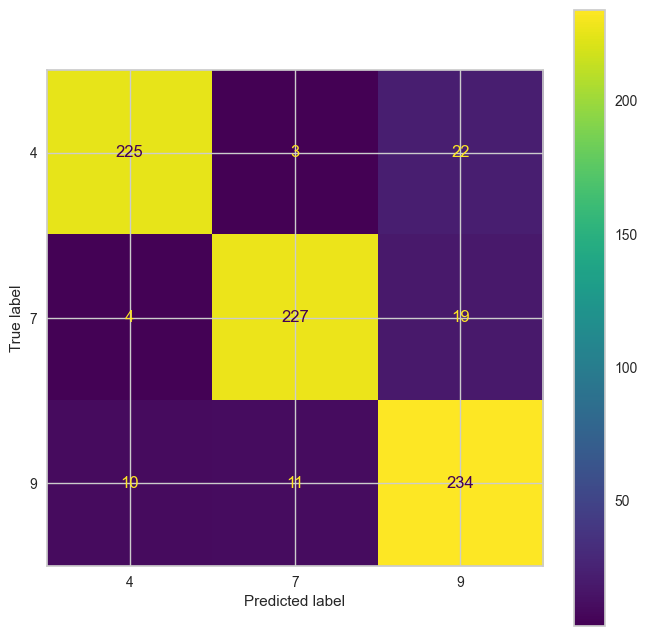

In [22]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(lda_model, X_test_copia,y_test, ax=plt.subplot());

#### A continuación ploteamos la curva ROC

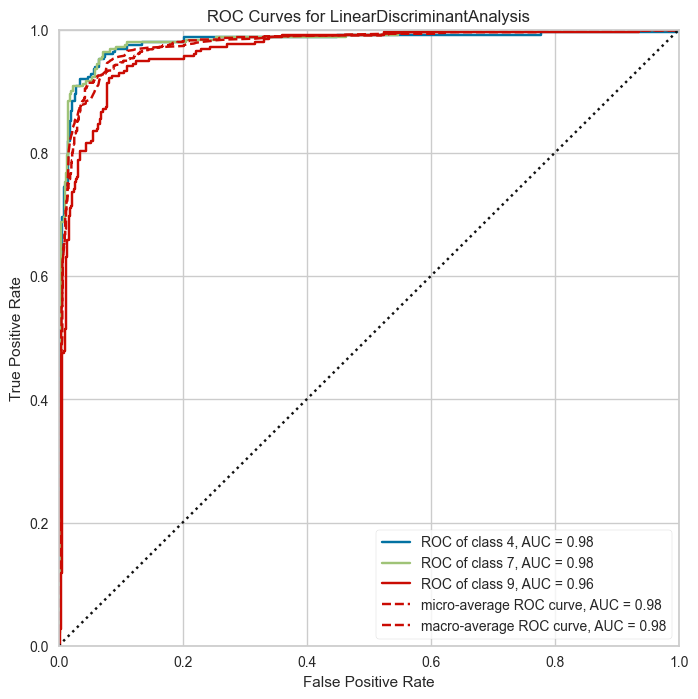

In [23]:
plt.figure(figsize=(8,8));
roc_auc(lda_model, X_train_copia, y_train, X_test_copia, y_test);

Vemos que para los dígitos 4 i 7 tenemos la misma AUC. Que divergen de la AUC del digito 9 en un 0.02. Podemos ver que aunque no tienen una AUC=1, tenemos casi, un clasificador con predicción perfecta. Es decir, para los tres dígitos la tasa de verdaderos positivos es 1 y la de falsos positivos es 0.

#### b)  Asumiendo que los píxeles son independientes y se distribuyen de manera gausiana, ajusta un modelo Naïve Bayes gausiano y evalúa la calidad del modelo. Cuanto más acerquemos los datos a lo que supone el modelo que ajustamos probablemente obtengamos un mejor resultado. Una posibilidad es binarizar la matriz de datos usando un límite de 0.5 y asumir que los píxeles siguen una distribución de Bernoulli. Transforma los datos a binarios utilizando la función $\texttt{Binarizer}$ y ajusta un Naïve Bayes Bernoulli. Evalúa la calidad del modelo y comenta los resultados.

#### Asumimos que los píxeles son independientes y que siguen una distribución gausiana y ajustamos un modelo de Naïve Bayes Gausiano

Ahora, a diferencia del modelo LDA, nuestro modelo de Naïve Bayes gausiano, asumirá que los píxeles son idependientes a diferencia del LDA. Esta implementación nos estimará una matriz de covarianzas independiente por cada etiqueta de clase: 4, 7, 9.

In [24]:
gnb = GaussianNB()
print(np.mean(cross_val_score(gnb,X_train_copia,y_train,cv=10)))

0.5919328728685518


Vemos que usando este modelo no tiene una buena precisión con respecto a la que habia obtenido LDA

In [25]:
gnb_model = GaussianNB().fit(X_train_copia, y_train)

print('Priors:', gnb_model.class_prior_)
print('Means:')
means = pd.DataFrame(gnb_model.theta_)
means.columns= data_columns
means

Priors: [0.31590607 0.34847142 0.33562251]
Means:


,0,1,2,3,4,5,6,7,8,9,...,774,775,776,777,778,779,780,781,782,783
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.005916,0.001668,0.001177,0.000160,0.000000,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000593,0.000676,0.000735,0.000101,0.000399,0.0,0.0,0.0,0.0,0.0


In [26]:
print(classification_report(gnb_model.predict(X_test_copia), y_test))

              precision    recall  f1-score   support

           4       0.43      0.92      0.59       118
           7       0.29      0.90      0.44        80
           9       0.97      0.45      0.61       557

    accuracy                           0.57       755
   macro avg       0.56      0.75      0.54       755
weighted avg       0.82      0.57      0.59       755



El acierto con el conjunto de test es parecido al de validación cruzada, y dos de las tres clases no tienen unos valores demasiado buenos, donde la clase del dígito 7 parece la peor de todas.

Vemos que este modelo desbalancea mas la precisión de cada clase, con un acierto peor para la clase 4 y 7. 

Tenemos dos situaciones que se nos estan dando:

* Con la clase del 4 y 7 tenemos un alto recall pero una baja precision lo que significa es que devuelve muchos resultados, pero la mayoría de sus etiquetas predichas son incorrectas en comparación con las etiquetas de entrenamiento. 

* Con la clase del 9 tenemos una alta precision pero poco recall lo que es todo lo contrario, arroja muy pocos resultados, pero la mayoría de sus etiquetas predichas son correctas en comparación con las etiquetas de entrenamiento. 

#### Representamos la matriz de confusión con los errores que comete el modelo

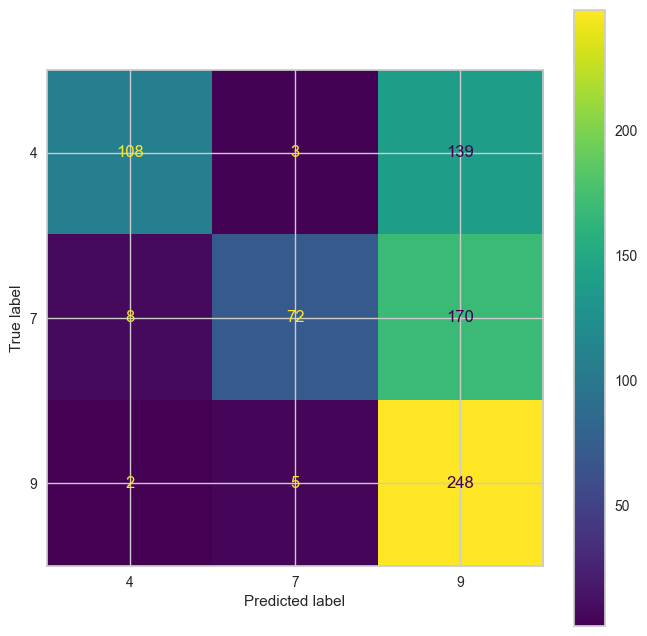

In [27]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(gnb_model, X_test_copia, y_test, display_labels=clases, ax=plt.subplot());

#### La curva ROC

La curva ROC con más de dos clases nos muestra la tasa de $\frac{verdaderos positivos}{falsos positivos}$ de una clase respecto al resto y una media/media ponderada. 

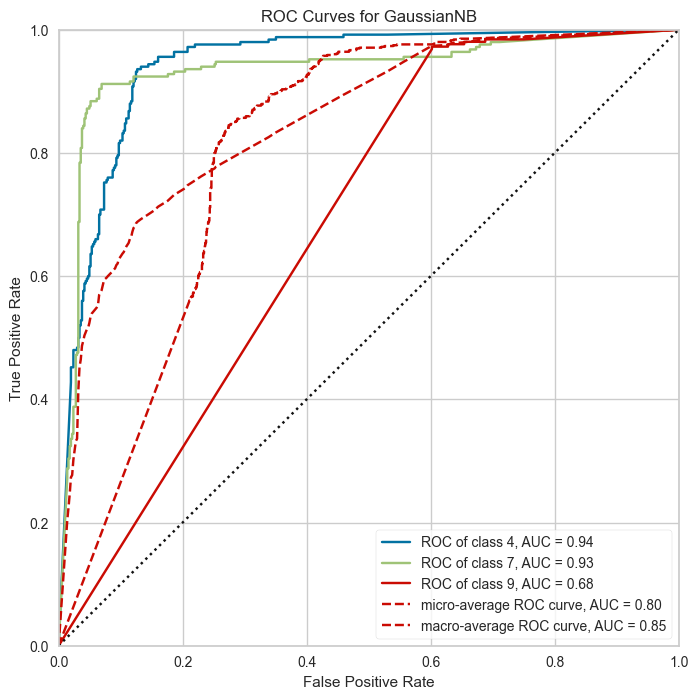

In [28]:
plt.figure(figsize=(8,8));
roc_auc(gnb_model, X_train_copia, y_train, X_test_copia, y_test);

Podemos ver que las AUC del dígito 9 no es demadiaso buena tal y como podíamos esperar con un alto porcentaje de falsos positivos, por otro lado la AUC de las clases 4 y 7 es mejor.

### A continuación binarizaremos la matriz de datos usando un límite de 0.5 y asumiremos que los píxeles siguen una distribución de Bernoulli ajustando un modelo de Naïve Bayes Bernoulli.

In [29]:
X_train_bin = Binarizer(threshold=0.5).transform(X_train_copia)
X_test_bin  = Binarizer(threshold=0.5).transform(X_test_copia)

X_train_bin.shape, X_test_bin.shape

((4514, 784), (755, 784))

In [30]:
X_train_bin = pd.DataFrame(X_train_bin)
X_test_bin = pd.DataFrame(X_test_bin)

X_train_bin.shape, X_test_bin.shape

X_train_bin_2 = X_train_bin.copy()

#### Antes pero de ajustar el modelo podemos aplicar un PCA a la nueva matriz de datos para ver como ha cambiado la separabilidad entre clases

In [31]:
myPCA = PCA().fit(X_train_bin[data_columns]);

#PCA.explained_variance_ratio_ para comprender qué porcentaje de varianza explican los datos
print(myPCA.explained_variance_ratio_)
print(myPCA.explained_variance_ratio_.cumsum())

X_train_bin.shape, X_test_bin.shape

[9.86798398e-02 7.04159474e-02 6.36020040e-02 5.31339161e-02
 3.52681806e-02 3.22573620e-02 2.92687983e-02 2.81081504e-02
 2.39018796e-02 2.16883416e-02 2.00622161e-02 1.80625948e-02
 1.71227051e-02 1.48541649e-02 1.27857931e-02 1.22601056e-02
 1.08417855e-02 1.04941546e-02 1.01347878e-02 8.92418783e-03
 8.42672796e-03 8.39248180e-03 7.92445291e-03 7.67216304e-03
 7.26547858e-03 6.76383979e-03 6.59597574e-03 6.32187391e-03
 5.93263536e-03 5.90091617e-03 5.56263645e-03 5.30204256e-03
 5.12971018e-03 4.85244121e-03 4.75997704e-03 4.61781320e-03
 4.41360918e-03 4.37273155e-03 4.06526852e-03 3.95588871e-03
 3.81041156e-03 3.74375705e-03 3.66060359e-03 3.52344667e-03
 3.49995732e-03 3.31201567e-03 3.15033722e-03 3.11434482e-03
 3.02280040e-03 2.98051696e-03 2.84618846e-03 2.78909934e-03
 2.74665561e-03 2.71329826e-03 2.61310964e-03 2.59562078e-03
 2.55321005e-03 2.52241692e-03 2.47551531e-03 2.41137283e-03
 2.37521385e-03 2.28800414e-03 2.24981956e-03 2.19382900e-03
 2.16139375e-03 2.142038

((4514, 784), (755, 784))

((4514, 784), (755, 784))

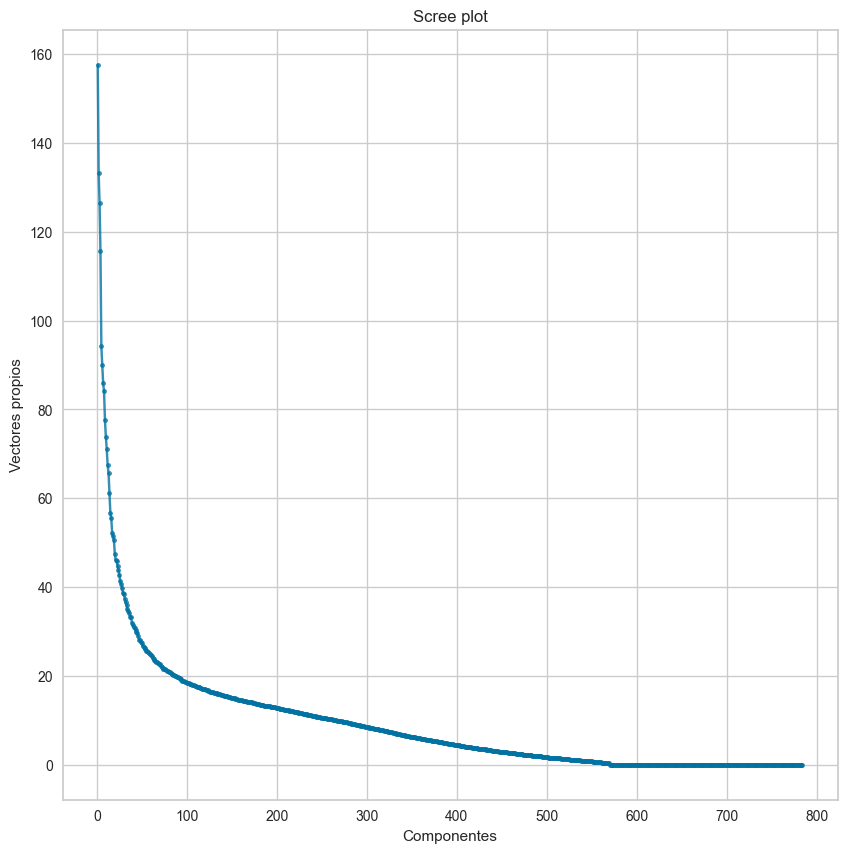

In [32]:
fig = plt.figure(figsize=(10,10));
plt.plot(range(1,len(myPCA.singular_values_ )+1),myPCA.singular_values_ ,alpha=0.8,marker='.');
#La nueva base son los vectores propios de la matriz de covarianza.
y_label = plt.ylabel('Vectores propios');
x_label = plt.xlabel('Componentes');
plt.title('Scree plot');


X_train_bin.shape, X_test_bin.shape

((4514, 784), (755, 784))

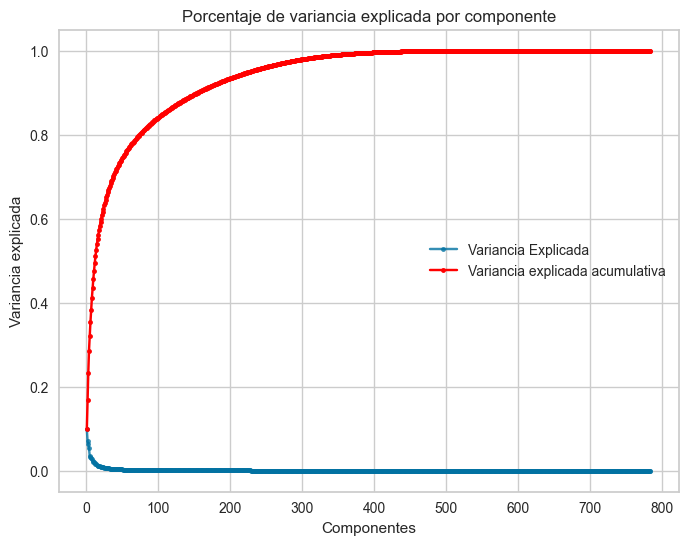

In [33]:
fig = plt.figure(figsize=(8,6));
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),myPCA.explained_variance_ratio_ ,alpha=0.8,marker='.',label="Variancia Explicada");
y_label = plt.ylabel('Variancia explicada');
x_label = plt.xlabel('Componentes');
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),
         np.cumsum(myPCA.explained_variance_ratio_),
         c='red',marker='.',
         label="Variancia explicada acumulativa");
plt.legend();
plt.title('Porcentaje de variancia explicada por componente');

X_train_bin.shape, X_test_bin.shape

Podemos ver que la variancia explicada acumulada pasa del 85% a partir del aproximadamente 90/95 componentes, las primeras cincuenta componentes acumulan cerca del 75%. Podemos ver que a pesar del gran número de píxeles que tenemos, ahora con repecto al mismo plot que hemos hecho antes, binarizando la matriz de datos podemos ver una ligera mejora y una mayor explicabilidad de la varianza de los datos con menos componentes.

#### Pesos que le asigna el nuevo PCA a cada componente visualizado con un heatmap

((4514, 784), (755, 784))

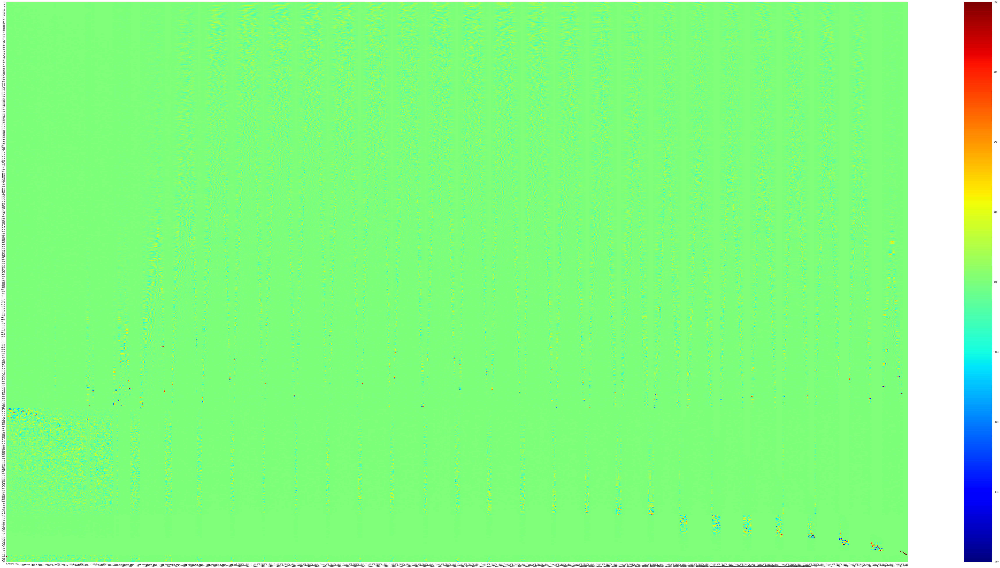

In [34]:
fig, ax = plt.subplots(figsize=(100,50))
sns.heatmap(myPCA.components_, cmap='jet', xticklabels=list(X_train_bin[X_train_copia.columns]), vmin=-np.max(np.abs(myPCA.components_)), vmax=np.max(np.abs(myPCA.components_)),ax=ax)

X_train_bin.shape, X_test_bin.shape

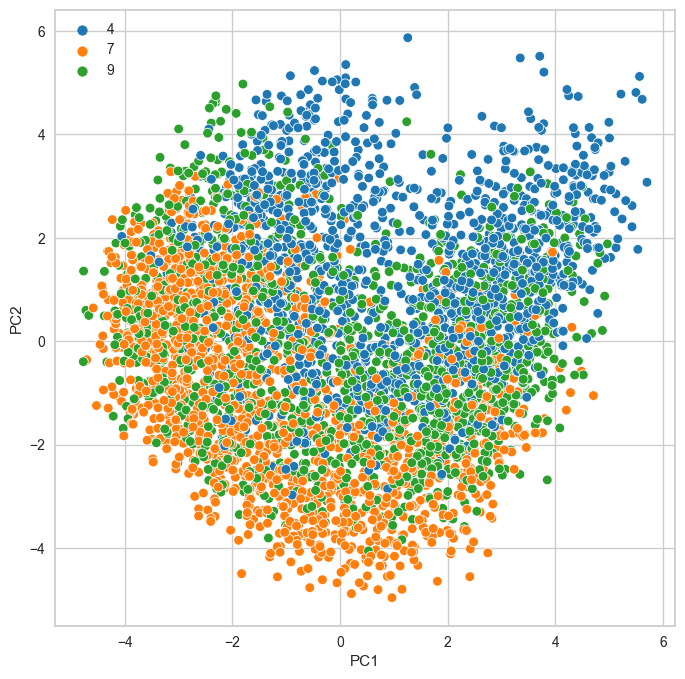

In [35]:
transformed_train = myPCA.transform(X_train_bin_2[X_train_copia.columns])
transformed_train

X_train_bin_2[['PC1','PC2','PC3']] = transformed_train[:,:3]

fig = plt.figure(figsize=(8,8))
_ = sns.scatterplot(x='PC1', y='PC2', data=X_train_bin_2, hue=y_train, palette='tab10')

Se puede empezar a ver una mejor separabilidad de las clases, ahora las clases del dígito 7 y 9 no estan tan juntas como antes. Aún así, vemos que tenemos la mayoria de los datos siguen sin agruparse de forma correcta.

In [36]:
import plotly.express as px

fig = px.scatter_3d(X_train_bin_2, x='PC1', y='PC2', z='PC3',color=y_train)
fig.show()

No podemos apreciar una buena separabilidad entre clases con estas dos componentes aunque los datos estan más dispersos con respecto al PCA con la matriz sin binarizar. Ante esta situación podemos volver a realizar un t-SNE para ver si realmente se puede ver una mejora en la separabilidad.

In [37]:
loadings = myPCA.components_.T * np.sqrt(myPCA.explained_variance_ratio_)

fig = px.scatter(X_train_bin_2, x='PC1', y='PC2', color=y_train)

for i, feature in enumerate(X_train_copia.columns):
    fig.add_shape(type='line',x0=0, y0=0,x1=loadings[i, 0],y1=loadings[i, 1])
    fig.add_annotation(x=loadings[i, 0],y=loadings[i, 1],ax=0, ay=0,xanchor="center",yanchor="bottom",text=feature,)
fig.show()

#### Ante esta situación realizamos un t-SNE para ver si vemos una mejor separabilidad usando distancias

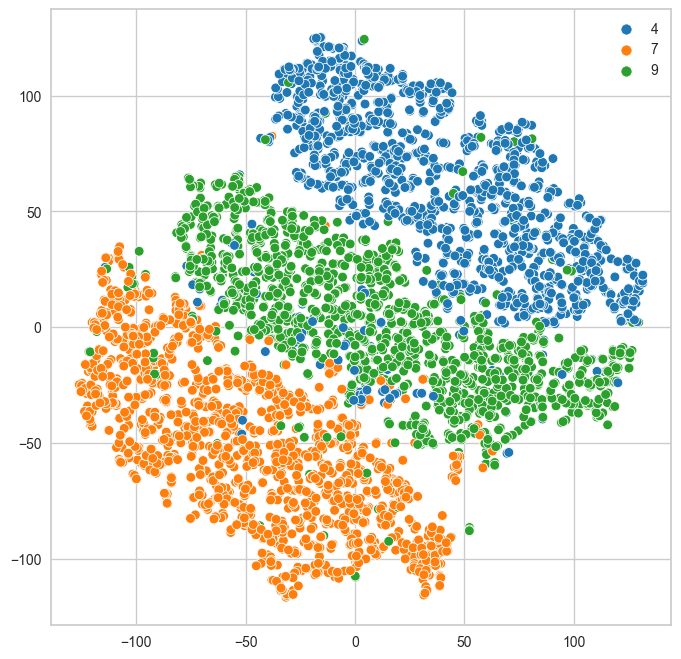

In [38]:
from sklearn.manifold import TSNE

transformed_train = TSNE(n_components=2, perplexity=10, n_iter=2000, init='pca').fit_transform(X_train_bin_2[data_columns])

fig = plt.figure(figsize=(8,8))
sns.scatterplot(x=transformed_train[:,0], y=transformed_train[:,1], hue=y_train, palette='tab10');

Tenemos una mejor visualización de la separabilidad entre clases y también vemos un patrón de grupos claro. Además con repecto al mismo plot que teníamos antes vemos que se han reducido el número de pequeños grupos de distintas clases de dígitos que se agrupan en clases que no son las suyas, puesto que distintos ejemplos de varias clases tienen un parecido de escritura. 

Vemos que igualmente el conjunto de datos es ciertamente sencillo de clasificar correctamente al menos con los píxeles que tenemos.

Parece que podríamos decir que este problema tiende a parecer que tiene cierta naturaleza no lineal

### Ajustamos el modelo de Naive Bayes Bernoulli

In [39]:
bnb = BernoulliNB()

print(np.mean(cross_val_score(bnb, X_train_bin, y_train, cv=10)))

0.8593249023801581


Vemos que obtenemos un mejor error de validación cruzada con respecto al modelo de **Naïve Bayes Gausiano** pero no tan bueno como al que habíamos obtenido para el LDA.

In [40]:
bnb_model = BernoulliNB().fit(X_train_bin, y_train)

In [41]:
print(classification_report(bnb_model.predict(X_test_bin), y_test, target_names=clases))

              precision    recall  f1-score   support

           4       0.82      0.89      0.86       231
           7       0.88      0.92      0.90       238
           9       0.87      0.78      0.82       286

    accuracy                           0.86       755
   macro avg       0.86      0.87      0.86       755
weighted avg       0.86      0.86      0.86       755



El acierto con el conjunto de test es parecido al de validación cruzada y ahora todas las clases tiene unos valores buenos y sin desbalances notables en la precisión como sucedia antes con el modelo de NB gausiano. Aún así, otra vez, la clase del dígito 9 sigue siendo la peor de todas con respecto al recall que obtiene.

Cabe destacar que ahora la clase que obtiene mejor precision es la del 7, además esta también tiene el mejor recall, lo que nos indica que realiza una muy buena clasificación de esta clase.

#### Vemos ahora la matriz de confusión

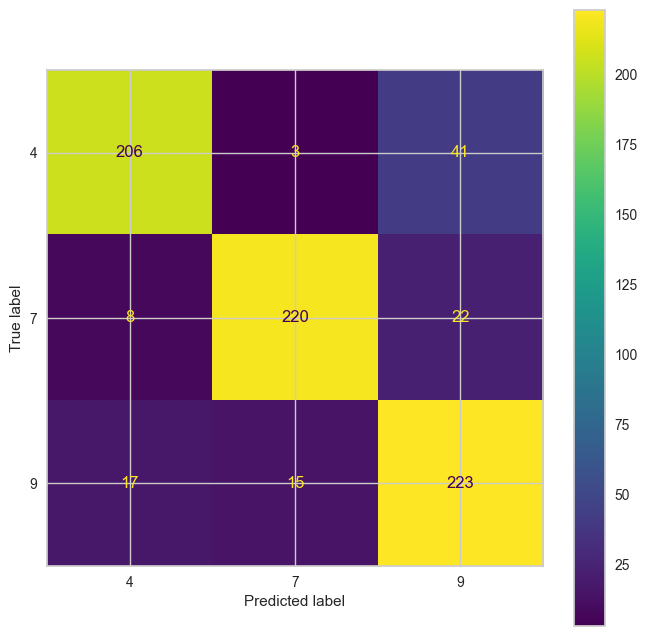

In [42]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(bnb_model, X_test_bin, y_test, display_labels=clases, ax=plt.subplot());

#### La curva ROC

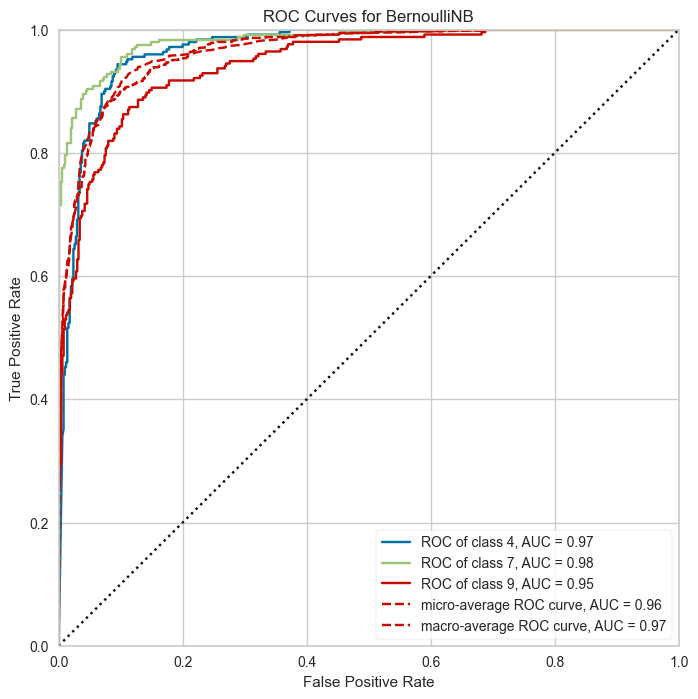

In [43]:
plt.figure(figsize=(8,8));
roc_auc(bnb_model, X_train_bin, y_train, X_test_bin, y_test);

Vemos que ahora las tres AUC tienen un valor parecido, la mejor siendo la del 7 seguida de la del 4. Vemos que la curva ROC de la clase del 7 tiene la mejor tasa de $\frac{verdaderos positivos}{falsos positivos}$ respecto al resto. 

### Comentando los resultados

Vemos que realmente este modelo último de **NB Bernoulli** es mejor que el modelo de **NB Gausiano** puesto que obtenemos un mejor error con el conjunto de test, ya que pasamos de una precision del ***0.57*** con el conjunto de test del **NB Gausiano** a una accuracy del ***0.86*** con el modelo del **NB Bernoulli**. Vemos que ambos errores del conjunto de test tienen un acierto parecido al de validación cruzada.

Cabe notar que la AUC de los dígitos 4,7 no ha mejorado notablemente, puesto que con el modelo de ***NBG*** habíamos obtenido unos valors del **0.93 y 0.94** y ahora unos valores del **0.97 y 0.98** esto se debe a que ahora  tenemos una precision mayor pero un recall parecido al que ya teníamos con el modelo de ***NBG*** y además ha mejorado la media/media ponderada

El AUC del dígito 9 ahora si que ha mejorado ya que, hemos pasado de una AUC=0.68 a una AUC del 0.95 con un mayor recall ahora sí.

#### c) En esta aplicación la calidad del modelo es bastante importante y es probable que las fronteras entre los dígitos sean complejas. Ajusta un modelo K nearest neighbours a la matriz original y la binarizada explorando adecuadamente los hiperparámetros de este modelo. Comenta los resultados

#### Ajustando un modelo de KNN a la matriz original

Es importate que todos los atributos se encuenten en la misma escala asi pues, primero de todo los normalizamos el conjunto de entrenamiento y test utilizando el MinMax scaler.

In [44]:
scaler = MinMaxScaler()

X_train_standarized = scaler.fit_transform(X_train_copia)
X_test_standarized = scaler.transform(X_test_copia)

In [45]:
knn =  KNeighborsClassifier()
print(np.mean(cross_val_score(knn, X_train_standarized, y_train, cv=10)))

0.9685404116712123


Vemos que obtenemos un muy buen error de validación cruzada. Además este es mucho mejor que los errores de validación de los modelos de Naïve Bayes Bernoulli y de NB Gausiano.

#### Explorando el rango de hiperparámetros de KNN

Para poder ajustar el modelo lo mejor posible, exploraremos para los distintos hiperpárametros los mejores valores que permiten ajustar los datos usando el modelo KNN.

Exploraremos:

* Número de vecinos usamos para hacer la predicción
* Función de peso utilizada en la predicción:
    * uniform: pesos uniformes. Todos los puntos en cada vecindario se ponderan por igual.
    * distance: los vecinos más cercanos de un punto tendrán una mayor influencia que los vecinos más alejados.
* Métrica a utilizar para el cálculo de la distancia entre vecinos. Usaremos 3 métricas para hacer combinaciones, aunque tenemos estas otras opciones: **'chebyshev', 'cityblock', 'euclidean', 'infinity', 'manhattan', 'minkowski', 'p'**
* Tamaño de hoja. Este hiperparámetro influye en la velocidad de construcción y consulta, así como la memoria requerida para almacenar el árbol. Si obtenemos el mismo resultado para distintos tamaños de hoja, mejor coger el que tenga un mayor tamaño, así podemos reducir un poco el tiempo de construcción del árbol, porque necesitaremos crear menos nodos

Notamos que para el conjunto de hiperparámetros que siguen tendremos: 504 combinaciones(12·2·3·7)

In [46]:
param = {'n_neighbors':[1, 2, 3, 4, 5, 6, 7, 9, 11, 13, 15, 17],
         'weights':['distance', 'uniform'],
         'metric': ['l2', 'l1', 'cosine'],
         'leaf_size':[1, 5, 10, 15, 20, 25, 30]}
kne =  KNeighborsClassifier()
gknn =  GridSearchCV(kne, param, cv=10, n_jobs=-1, refit=True);
gknn.fit(X_train_standarized, y_train);

In [47]:
show_html(pd.DataFrame(gknn.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

,params,mean_test_score,rank_test_score
55,"{'leaf_size': 1, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}",0.972309,1
199,"{'leaf_size': 10, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}",0.972309,1
415,"{'leaf_size': 25, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}",0.972309,1
127,"{'leaf_size': 5, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}",0.972309,1
343,"{'leaf_size': 20, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}",0.972309,1


Como podemos ver tenemos un conjuto de hiperparámetros que da el mismo resultado hasta el sexto decimal. Vemos que todo el conjunto de hiperparámetros obtiene el mismo resultado con la misma métrica, el mismo número de vecinos, la misma función de peso, pero distinto tamaño de hoja. 

Así que, a igualdad de resultados, mejor quedarnos con el resultado que usa un tamaño de hoja más grande, para reducir el tiempo de construcción del árbol y además con un tamaño de hoja grande podemos tener un mejor tiempo de consulta.

Así que nos podemos queda con la combinación 415 de: 

**{'leaf_size': 25, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}**

In [48]:
print(classification_report(gknn.predict(X_test_standarized), y_test, target_names=clases))

              precision    recall  f1-score   support

           4       0.97      0.99      0.98       246
           7       0.98      0.97      0.98       252
           9       0.96      0.96      0.96       257

    accuracy                           0.97       755
   macro avg       0.97      0.97      0.97       755
weighted avg       0.97      0.97      0.97       755



Podemos ver que el acierto en el test es consistente con la validación cruzada que hemos obtenido arriba. Como podemos apreciar la mejor clase de todas es la clase del dígito 4 con la mejor relación **precision-recall**, seguida de la clase del 7 y finalmente la *peor* clase, la del dígito 9.

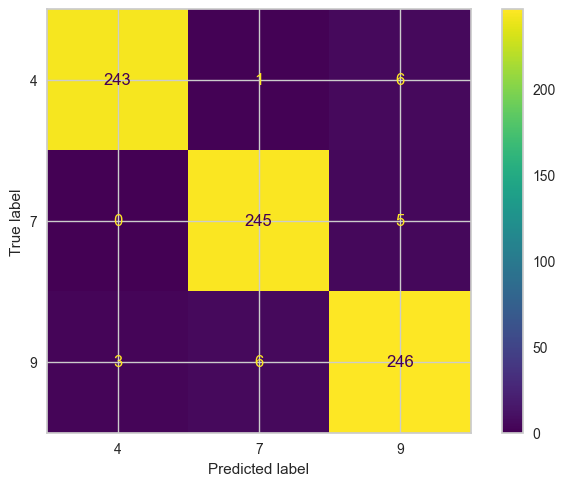

In [49]:
ConfusionMatrixDisplay.from_estimator(gknn, X_test_standarized,y_test)

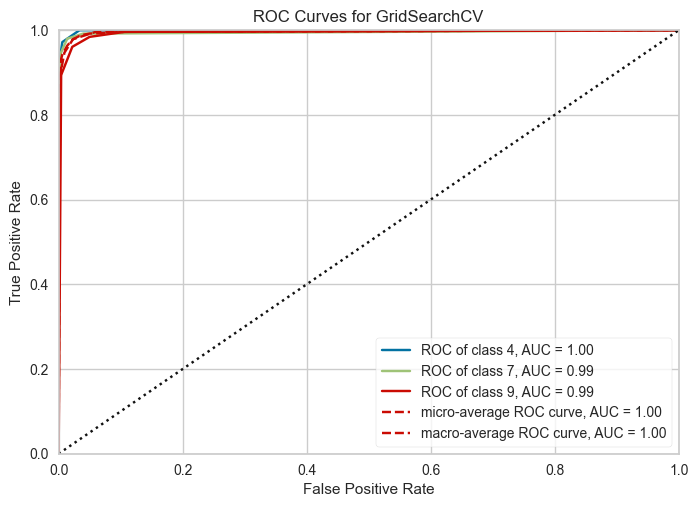

In [50]:
roc_auc(gknn, X_train_standarized, y_train, X_test_standarized, y_test);

Como podemos ver obtenenemos un AUC perfecta para la clase del dígito 4, seguida de unas AUC de 0.99 para las otras clases. Por lo tanto, para la clase del 4, tenemos un 100% de predicciones correctas.

Podemos usar permutation importance para ver que píxeles parecen ser los más importantes para la clasificación.

In [51]:
c = choice(X_test_copia.shape[0], size=300, replace=False)
pi = permutation_importance(gknn, X_test_standarized[c], y_test[c], n_jobs=-1, random_state=42)
var_imp = pd.DataFrame({'importance': pi.importances_mean}, index=data_columns[:])

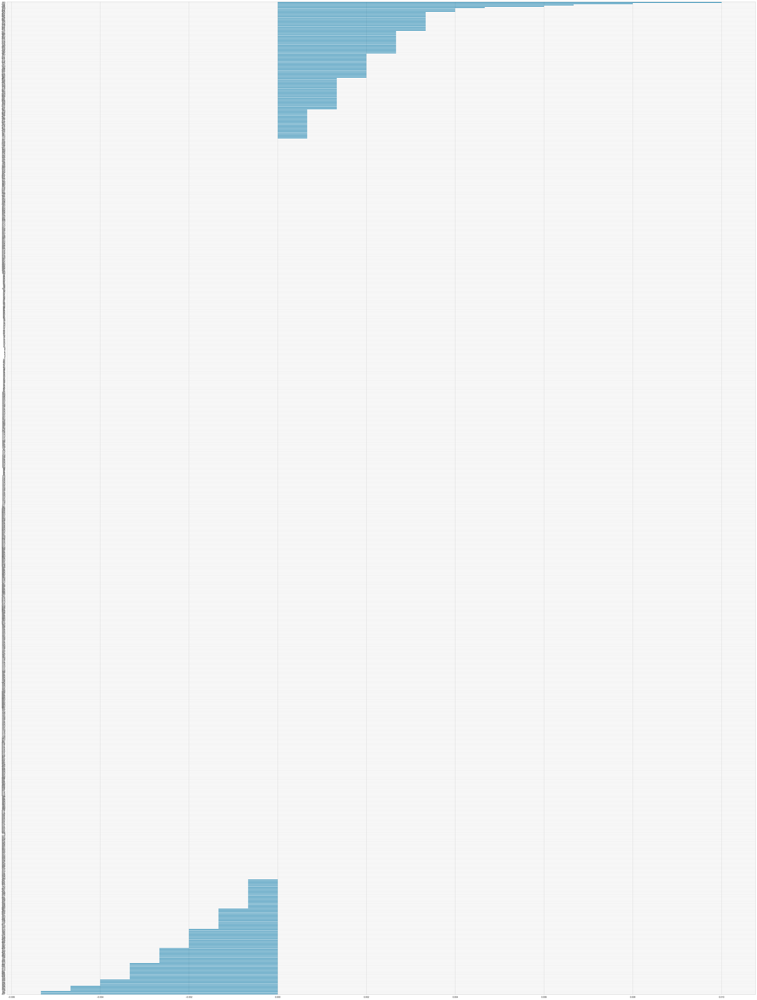

In [52]:
var_imp.sort_values(by='importance').plot.barh(figsize=(60,80), legend=False);

En esta ejecución los píxeles más importantes, parecen ser los que se encuentran en el rango [200-400] aunque si lo volvemos a ejecutar veremos que otros píxeles tendran más o menos importancia, aunque suele ser más o menos consistente. Puede pasar que un píxel a lo mejor sea el que tenga más peso en la decisión y después ver que ese peso, para otra ejecución, tiene un peso que su importancia este en la mitad de la tabla.

#### Ajustando un modelo de KNN a la matriz binarizada

In [53]:
X_train_bin = Binarizer(threshold=0.5).transform(X_train_copia)
X_test_bin  = Binarizer(threshold=0.5).transform(X_test_copia)

In [54]:
X_train_bin = pd.DataFrame(X_train_bin)
X_test_bin = pd.DataFrame(X_test_bin)

In [55]:
scaler = MinMaxScaler()

X_train_standarized_bin = scaler.fit_transform(X_train_bin)
X_test_standarized_bin = scaler.transform(X_test_bin)

In [56]:
knn_bin =  KNeighborsClassifier()
print(np.mean(cross_val_score(knn_bin, X_train_standarized_bin, y_train, cv=10)))

0.9599032631516982


Vemos que obtenemos un muy buen error de validación cruzada. Además este es mucho mejor que los errores de validación de los modelos de Naïve Bayes Bernoulli y de NB Gausiano pero no tant bueno como el KNN con la matriz de datos sin binarizar. Aún así conseguimos un buen error de validación cruzada.

In [57]:
param = {'n_neighbors':[1, 2, 3, 4, 5, 6, 7, 9, 11, 13, 15, 17],
         'weights':['distance', 'uniform'],
         'metric': ['l2', 'l1', 'cosine'],
         'leaf_size':[1, 5, 10, 15, 20, 25, 30]}
kne =  KNeighborsClassifier()
gknn =  GridSearchCV(kne, param, cv=10, n_jobs=-1, refit=True);
gknn.fit(X_train_standarized_bin, y_train);

In [58]:
show_html(pd.DataFrame(gknn.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

,params,mean_test_score,rank_test_score
199,"{'leaf_size': 10, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}",0.966325,1
55,"{'leaf_size': 1, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}",0.966325,1
415,"{'leaf_size': 25, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}",0.966325,1
127,"{'leaf_size': 5, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}",0.966325,1
271,"{'leaf_size': 15, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}",0.966325,1


Otra vez, podemos ver como tenemos un conjuto de hiperparámetros que da el mismo resultado hasta el sexto decimal.

Asimismo podemos ver tenemos un conjuto de hiperparámetros que da el mismo resultado hasta el sexto decimal. Vemos que todo el conjunto de hiperparámetros obtiene el mismo resultado con la misma métrica, el mismo número de vecinos, la misma función de peso, pero distinto tamaño de hoja. 

Así que, a igualdad de resultados, mejor quedarnos con el resultado que usa un tamaño de hoja más grande, para reducir el tiempo de construcción del árbol y además con un tamaño de hoja grande podemos tener un mejor tiempo de consulta.

Así que nos podemos queda con la misma combinación 415: 

**{'leaf_size': 25, 'metric': 'cosine', 'n_neighbors': 4, 'weights': 'uniform'}**

In [59]:
print(classification_report(gknn.predict(X_test_standarized_bin), y_test, target_names=clases))

              precision    recall  f1-score   support

           4       0.96      0.98      0.97       245
           7       0.97      0.95      0.96       254
           9       0.95      0.94      0.94       256

    accuracy                           0.96       755
   macro avg       0.96      0.96      0.96       755
weighted avg       0.96      0.96      0.96       755



Podemos ver que el acierto en el test es consistente con la validación cruzada que hemos obtenido arriba. 

Como podemos apreciar la mejor clase de todas es la clase del dígito 4 como había ocurrido antes con el KNN con la matriz bin binarizar. Seguimos teniendo para la clase del 4 la mejor relación **precision-recall**, seguida de la clase del 7 y finalmente la del dígito 9. 

Apenas hay mucha diferencia entre ambos modelos, aunque podemos notar que para el modelo KNN si no binarizamos la matriz de datos funciona un poco de mejor forma.

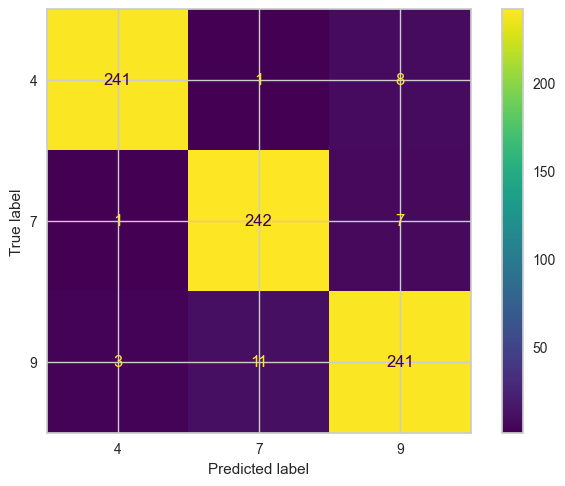

In [60]:
ConfusionMatrixDisplay.from_estimator(gknn, X_test_standarized_bin, y_test)

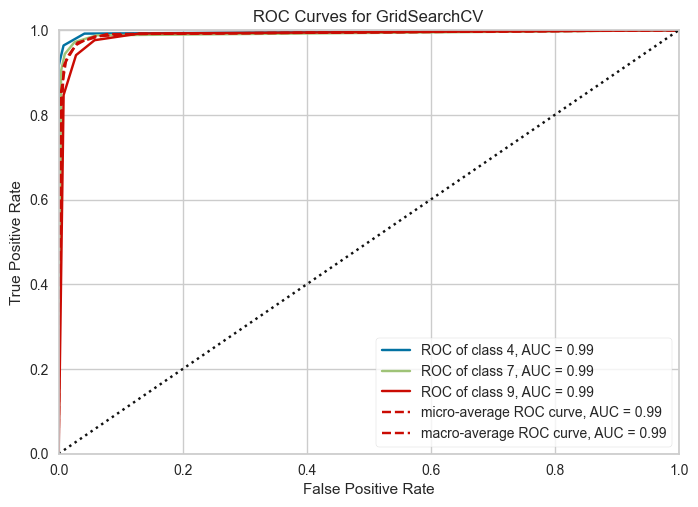

In [61]:
roc_auc(gknn, X_train_standarized_bin, y_train, X_test_standarized_bin, y_test);

Ahora ninguna AUC tiene es de 1.0, però podemos decir que ahora para todas las clases las predicciones son en un 99% correctas. Lo que casi, nos permite decir que tenemos un clasificador perfecto. 

In [62]:
c = choice(X_test_copia.shape[0], size=300, replace=False)
pi = permutation_importance(gknn, X_test_standarized_bin[c], y_test[c], n_jobs=-1, random_state=42)
var_imp = pd.DataFrame({'importance': pi.importances_mean}, index=data_columns[:])

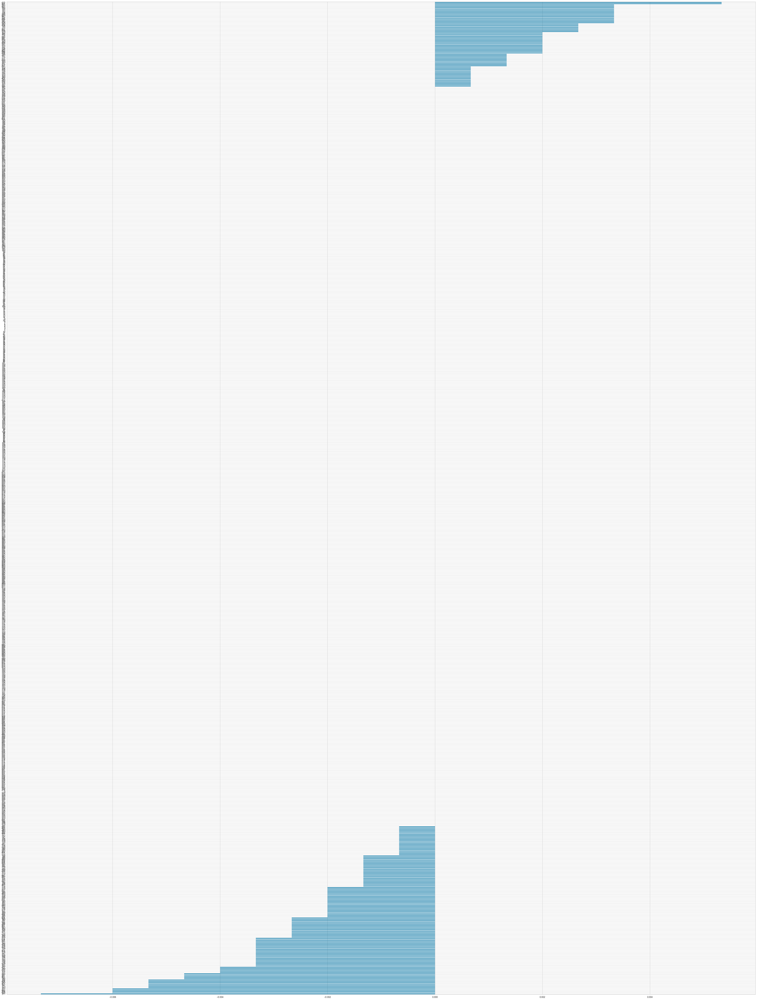

In [63]:
var_imp.sort_values(by='importance').plot.barh(figsize=(60,80), legend=False);

En esta ejecución los píxeles más importantes, parecen ser los que se encuentran en el rango [400-500] y sucede exactamente lo mismo que se ha comentado en el permutation importance realizado en celdas anteriores.

#### d) Habás observado al hacer el PCA que el número de componentes necesario para explicar la variancia de los datos no es muy grande respecto a su dimensionalidad real. Elige un número de componentes, obtén las matrices de datos transformadas. Ajusta un modelo Naïve Bayes y un K nearest neighbours a estos datos explorando adecuadamente sus hiperparámetros. Evalúa la calidad de los modelos. ¿Por qué sería más adecuado usar el Naïve Bayes con esta transformación? ¿Qué ventajas/inconvenientes tendría el trabajar con los datos transformados? ¿Qué modelo de entre todos elegirías para reconocer códigos postales? Razona tu respuesta.

Totalmente cierto, como se ha podido ver antes, con alrededor de 100 componentes podíamos explicar el 85% de la variancia de nuestros datos usando el **StandardScaler()** para los modelos de: **Naïve Bayes Gausiano** y para **Naïve Bayes Bernoulli**. Cabe notar que para la matriz de datos binarizada que ha usando el modelo de **NB B** hacían falta un poco menos de componentes, alrededor de 90/95, para explicar el 85% de la variancia. Pero aún así, con entorno a una septima parte de las componentes ya nos era suficiente.

Podemos probar cúantas componentes necesitariamos aplicando PCA usando el conjunto de datos original y usando la matriz binarizada, pero esta vez escalando ambos conjuntos usando **MinMaxScaler()**.

#### Aplicación del PCA con el conjunto de datos original usando MinMaxScaler()

In [64]:
X_train_standarized = X_train_copia.copy()
scaler = MinMaxScaler()

X_train_standarized[data_columns] = scaler.fit_transform(X_train_copia[data_columns])
X_train_standarized.describe().T

X_test_standarized = X_test_copia.copy()

X_test_standarized[data_columns] = scaler.transform(X_test_copia[data_columns])
X_test_standarized.describe().T

,count,mean,std,min,25%,50%,75%,max
0,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
779,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
780,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
781,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
782,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [66]:
myPCA = PCA().fit(X_train_standarized[data_columns]);

#PCA.explained_variance_ratio_ para comprender qué porcentaje de varianza explican los datos
print(myPCA.explained_variance_ratio_)
print(myPCA.explained_variance_ratio_.cumsum())

[1.20383131e-01 8.56801659e-02 7.67407439e-02 6.40229908e-02
 4.16757764e-02 3.79377822e-02 3.41932642e-02 3.27309530e-02
 2.73394291e-02 2.47745725e-02 2.26181525e-02 2.07564019e-02
 1.94411296e-02 1.66629127e-02 1.43462196e-02 1.36043031e-02
 1.20402580e-02 1.16023600e-02 1.10713421e-02 9.53762233e-03
 9.12810753e-03 9.01239016e-03 8.40022959e-03 8.36535886e-03
 7.83768807e-03 7.11331418e-03 6.88622497e-03 6.46543726e-03
 6.22964289e-03 6.07464483e-03 5.59678067e-03 5.39706460e-03
 5.23110454e-03 4.91791764e-03 4.73827562e-03 4.62125854e-03
 4.38231360e-03 4.24869069e-03 3.95712482e-03 3.87665575e-03
 3.73882802e-03 3.63387451e-03 3.38219686e-03 3.36559090e-03
 3.27953394e-03 3.15811098e-03 3.00375786e-03 2.90536973e-03
 2.80883092e-03 2.70035334e-03 2.59121925e-03 2.48537582e-03
 2.43805641e-03 2.40658228e-03 2.29004223e-03 2.26207479e-03
 2.23294914e-03 2.19105757e-03 2.10388622e-03 2.02611019e-03
 1.98158382e-03 1.94959243e-03 1.83706953e-03 1.79029368e-03
 1.76901487e-03 1.742102

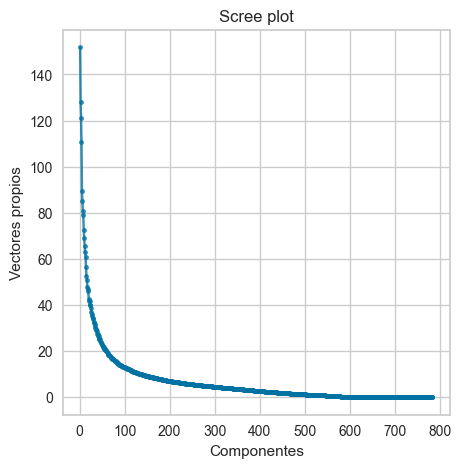

In [67]:
fig = plt.figure(figsize=(5,5));
plt.plot(range(1,len(myPCA.singular_values_ )+1),myPCA.singular_values_ ,alpha=0.8,marker='.');
#La nueva base son los vectores propios de la matriz de covarianza.
y_label = plt.ylabel('Vectores propios');
x_label = plt.xlabel('Componentes');
plt.title('Scree plot');

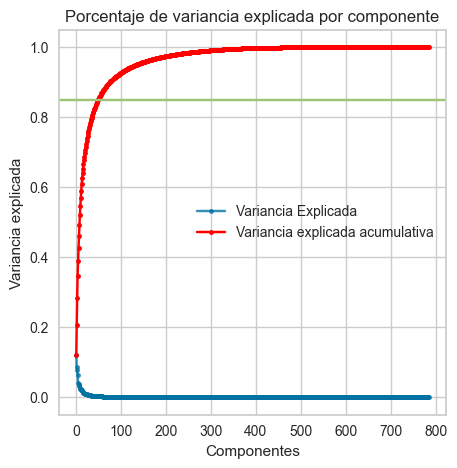

In [68]:
fig = plt.figure(figsize=(5,5));
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),myPCA.explained_variance_ratio_ ,alpha=0.8,marker='.',label="Variancia Explicada");
y_label = plt.ylabel('Variancia explicada');
x_label = plt.xlabel('Componentes');
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),
         np.cumsum(myPCA.explained_variance_ratio_),
         c='red',marker='.',
         label="Variancia explicada acumulativa");
plt.legend();
plt.title('Porcentaje de variancia explicada por componente');
plt.axhline(y=0.85, color='g', linestyle='-')

Podemos ver que usando **MinMaxScaler()** a la matriz original obtenemos que con alrededor de 50 podemos explicar el 85% de la variancia de los datos, cuando usando **StandardScaler()** solo podiamos hacerlo con un poco más de 100 componentes.

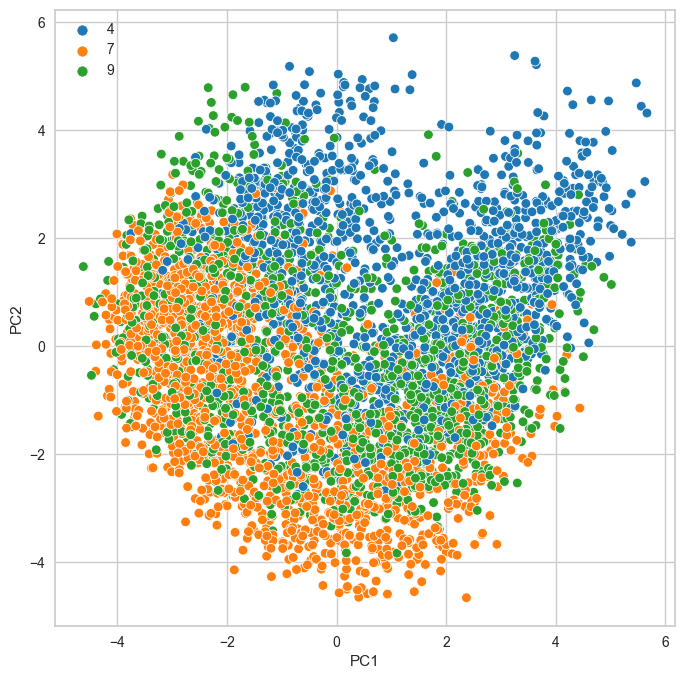

In [69]:
transformed_train = myPCA.transform(X_train_standarized[X_train_copia.columns])
transformed_train

X_train_standarized[['PC1','PC2','PC3']] = transformed_train[:,:3]

fig = plt.figure(figsize=(8,8))
_ = sns.scatterplot(x='PC1', y='PC2', data=X_train_standarized, hue=y_train, palette='tab10')

Podemos apreciar una mejor separabilidad de las clases, sobretodo para la clase del 7 aunque podemos seguir viendo que para la clase del 4 y del 9 el conjunto de datos parece aún agruparse.

In [70]:
import plotly.express as px

fig = px.scatter_3d(X_train_standarized, x='PC1', y='PC2', z='PC3',color=y_train)
fig.show()

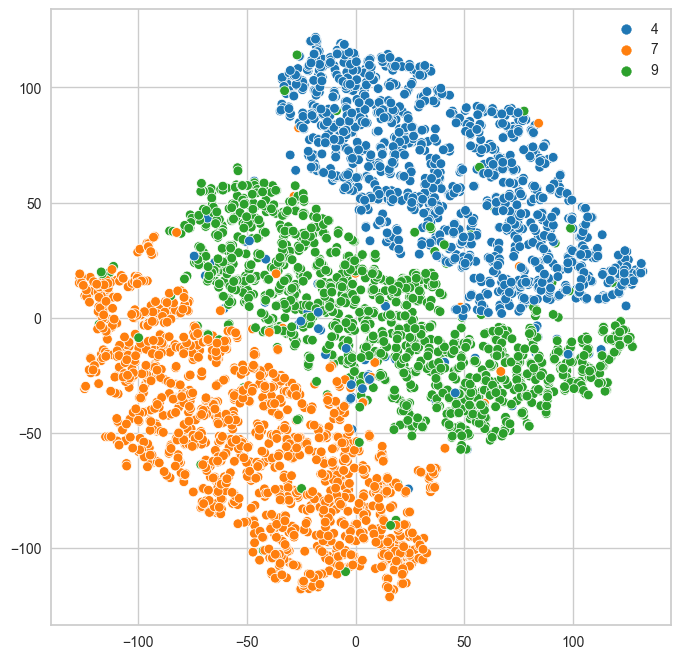

In [71]:
from sklearn.manifold import TSNE

transformed_train = TSNE(n_components=2, perplexity=10, n_iter=2000, init='pca').fit_transform(X_train_standarized[data_columns])

fig = plt.figure(figsize=(8,8))
sns.scatterplot(x=transformed_train[:,0], y=transformed_train[:,1], hue=y_train, palette='tab10');

Vemos que obtenemos una mejor visión de separabilidad de las clases si lo comparamos con el primer plot de t-SNE que hemos realizado usando la matriz de datos original. Este es mejor, ya que parece que tenemos los puntos mas juntos con puntos de su misma clase y no se nos han creado tantos conjuntos pequeños de puntos de la misma clase.

Con respecto al segundo plot de t-SNE no podemos apreciar casi distinciones, además contamos con un componente random a la hora de realizar este método

#### Aplicación del PCA con el conjunto de datos binarizado usando MinMaxScaler()

Veremos que tenemos el mismo resultado que hemos obtenido cuando hemos mostrado el PCA con los datos binarizados, puesto que la transformación será la misma usando StandardScaler() que MinMax() debido a la naturaleza de los datos binarizados.

In [72]:
X_train_bin = Binarizer(threshold=0.5).transform(X_train_copia)
X_test_bin  = Binarizer(threshold=0.5).transform(X_test_copia)

X_train_bin.shape, X_test_bin.shape

((4514, 784), (755, 784))

In [73]:
X_train_bin = pd.DataFrame(X_train_bin)
X_test_bin = pd.DataFrame(X_test_bin)

X_train_bin.shape, X_test_bin.shape

X_train_bin_2 = X_train_bin.copy()
X_test_bin_2 = X_test_bin.copy()

In [74]:
X_train_standarized_bin = X_train_bin_2.copy()
scaler = MinMaxScaler()

X_train_standarized_bin[data_columns] = scaler.fit_transform(X_train_bin_2[data_columns])
X_train_standarized_bin.describe().T

X_test_standarized_bin = X_test_bin_2.copy()

X_test_standarized_bin[data_columns] = scaler.transform(X_test_bin_2[data_columns])
X_test_standarized_bin.describe().T

,count,mean,std,min,25%,50%,75%,max
0,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
779,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
780,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
781,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
782,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [75]:
myPCA = PCA().fit(X_train_standarized_bin[data_columns]);

#PCA.explained_variance_ratio_ para comprender qué porcentaje de varianza explican los datos
print(myPCA.explained_variance_ratio_)
print(myPCA.explained_variance_ratio_.cumsum())

[9.86798398e-02 7.04159474e-02 6.36020040e-02 5.31339161e-02
 3.52681806e-02 3.22573620e-02 2.92687983e-02 2.81081504e-02
 2.39018796e-02 2.16883416e-02 2.00622161e-02 1.80625948e-02
 1.71227051e-02 1.48541649e-02 1.27857931e-02 1.22601056e-02
 1.08417855e-02 1.04941546e-02 1.01347878e-02 8.92418783e-03
 8.42672796e-03 8.39248180e-03 7.92445291e-03 7.67216304e-03
 7.26547858e-03 6.76383979e-03 6.59597574e-03 6.32187391e-03
 5.93263536e-03 5.90091617e-03 5.56263645e-03 5.30204256e-03
 5.12971018e-03 4.85244121e-03 4.75997704e-03 4.61781320e-03
 4.41360918e-03 4.37273155e-03 4.06526852e-03 3.95588871e-03
 3.81041156e-03 3.74375705e-03 3.66060359e-03 3.52344667e-03
 3.49995732e-03 3.31201567e-03 3.15033722e-03 3.11434482e-03
 3.02280040e-03 2.98051696e-03 2.84618846e-03 2.78909934e-03
 2.74665561e-03 2.71329826e-03 2.61310964e-03 2.59562078e-03
 2.55321005e-03 2.52241692e-03 2.47551531e-03 2.41137283e-03
 2.37521385e-03 2.28800414e-03 2.24981956e-03 2.19382900e-03
 2.16139375e-03 2.142038

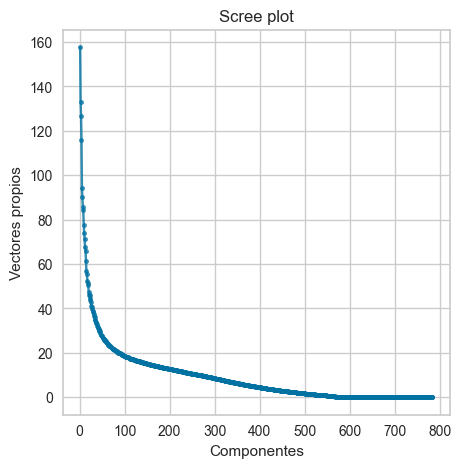

In [76]:
fig = plt.figure(figsize=(5,5));
plt.plot(range(1,len(myPCA.singular_values_ )+1),myPCA.singular_values_ ,alpha=0.8,marker='.');
#La nueva base son los vectores propios de la matriz de covarianza.
y_label = plt.ylabel('Vectores propios');
x_label = plt.xlabel('Componentes');
plt.title('Scree plot');

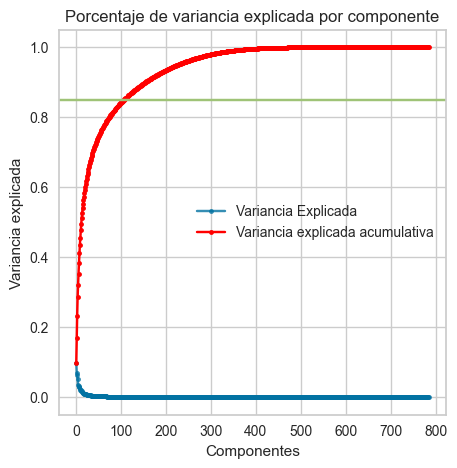

In [77]:
fig = plt.figure(figsize=(5,5));
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),myPCA.explained_variance_ratio_ ,alpha=0.8,marker='.',label="Variancia Explicada");
y_label = plt.ylabel('Variancia explicada');
x_label = plt.xlabel('Componentes');
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),
         np.cumsum(myPCA.explained_variance_ratio_),
         c='red',marker='.',
         label="Variancia explicada acumulativa");
plt.legend();
plt.title('Porcentaje de variancia explicada por componente');
plt.axhline(y=0.85, color='g', linestyle='-')

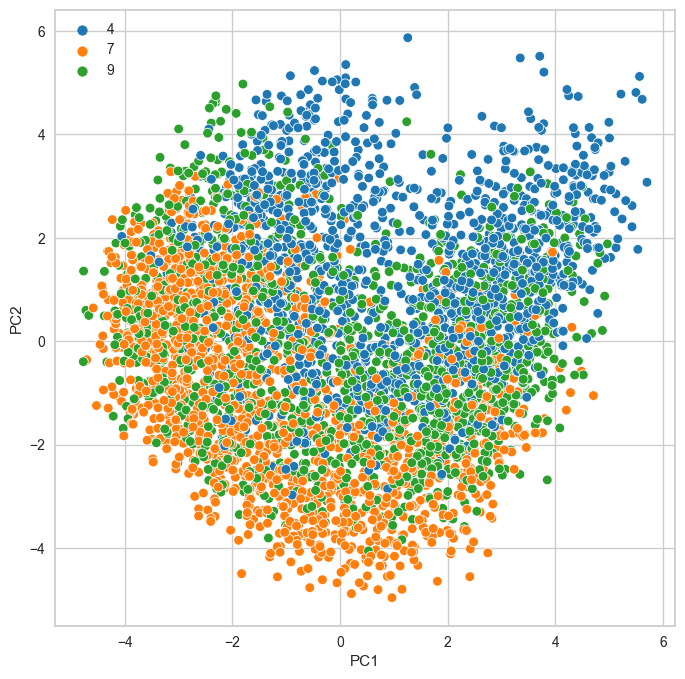

In [78]:
transformed_train = myPCA.transform(X_train_standarized_bin[X_train_bin_2.columns])
transformed_train

X_train_standarized_bin[['PC1','PC2','PC3']] = transformed_train[:,:3]

fig = plt.figure(figsize=(8,8))
_ = sns.scatterplot(x='PC1', y='PC2', data=X_train_standarized_bin, hue=y_train, palette='tab10')

### Ahora eligiremos un número de componentes y obtendremos las matrices de datos transformadas y ajustaremos los modelos de Naïve Bayes y KNN

Probaremos como se comportan los modelos para un cierto número de componentes, así que podemos intentar ver como se comporta el cross-validation score para los distintos números de componentes y eligiremos los primeros k componentes principales. Usaremos los componentes de PCA para reducir la dimensionalidad y comprobar si podemos reducir el tamaño sin comprometer en exceso la calidad del resultado.

Empezaremos por el modelo de Naïve Bayes Gausiano:

### Naïve Bayes Gausiano 

In [79]:
X_train_standarized = X_train_copia.copy()
X_test_standarized = X_test_copia.copy()

scaler = StandardScaler()

X_train_standarized[data_columns] = scaler.fit_transform(X_train_copia[data_columns])
X_test_standarized[data_columns] = scaler.transform(X_test_copia[data_columns])

myPCA = PCA().fit(X_train_standarized[data_columns]);

transformed_train = myPCA.transform(X_train_standarized[X_train_copia.columns])
transformed_test = myPCA.transform(X_test_standarized[X_train_copia.columns])

nc = 30
X_train_pca_todas = scaler.fit_transform(transformed_train[:,:])
X_train_pca_s = scaler.fit_transform(transformed_train[:,:nc])
X_test_pca_s = scaler.transform(transformed_test[:,:nc])

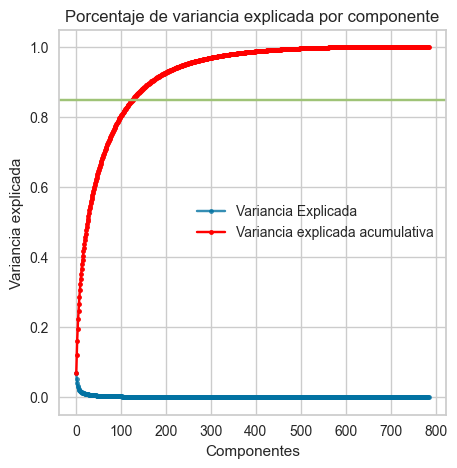

In [80]:
fig = plt.figure(figsize=(5,5));
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),myPCA.explained_variance_ratio_ ,alpha=0.8,marker='.',label="Variancia Explicada");
y_label = plt.ylabel('Variancia explicada');
x_label = plt.xlabel('Componentes');
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),
         np.cumsum(myPCA.explained_variance_ratio_),
         c='red',marker='.',
         label="Variancia explicada acumulativa");
plt.legend();
plt.title('Porcentaje de variancia explicada por componente');
plt.axhline(y=0.85, color='g', linestyle='-')

In [81]:
gnb = GaussianNB()
print(np.mean(cross_val_score(gnb,X_train_pca_todas,y_train,cv=10)))
print(np.mean(cross_val_score(gnb,X_train_pca_s,y_train,cv=10)))

0.49446412102898174
0.6825373310048467


1 0.4395272060122049
2 0.4769592645644879
3 0.7536604987932422
4 0.749227380648706
5 0.7472337774463826
6 0.7529958008751446
7 0.7649534956733317
8 0.7992901713007475
9 0.7990684418107253
10 0.8037218177893765
11 0.8003993093028277
12 0.8309749229833407
13 0.8407226811608421
14 0.8296425838353315
15 0.837171575456704
16 0.8236583403645781
17 0.8139140160508603
18 0.7919794753056139
19 0.7740316504130448
20 0.7605193964248572
21 0.7556442909561839
22 0.7523203108137276
23 0.7341546808468891
24 0.7297235249102288
25 0.7244103565331712
26 0.7162107803700724
27 0.7095662539489435
28 0.7004861370013539
29 0.6891828385299139
30 0.6825373310048467


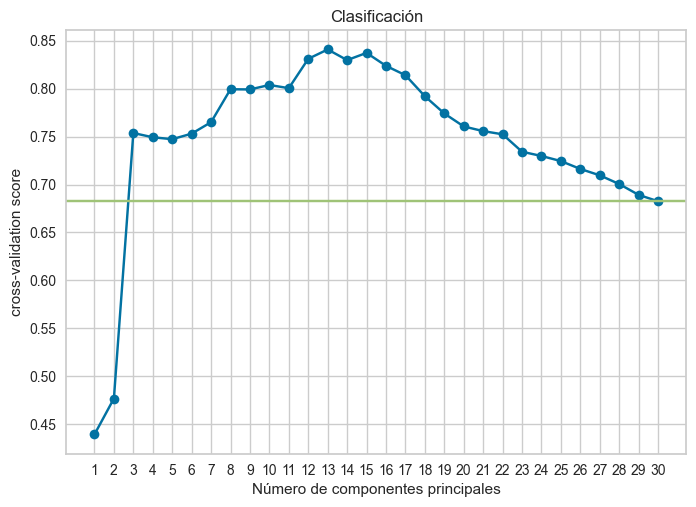

In [82]:
# NB Gaussià k components matriu sense binaritzar
_list = []

for i in range(1, X_train_pca_s.shape[1]+1):
    score = cross_val_score(gnb, X_train_pca_s[:,:i], y_train, cv=10).mean()
    print(i, score)
    _list.append(score)
    
plt.plot(_list, '-o')
plt.xlabel('Número de componentes principales')
plt.ylabel('cross-validation score')
plt.title('Clasificación')
plt.xticks(np.arange(X_train_pca_s.shape[1]), np.arange(1, X_train_pca_s.shape[1]+1))
plt.axhline(y = np.mean(cross_val_score(gnb,X_train_pca_s,y_train,cv=10)), color='g', linestyle='-');

Podemos ver que a partir de las 13/15 componentes principales, nuestro cross-validation score decrece significativamente a medida que incrementamos las componentes, esto es así ya que nuestros datos estan ciertamente correlacionados y no son independientes como asume Naïve Bayes. Si vamos añadinendo componentes solo empeorará nuestro score.

### Evaluamos la calidad del modelo con 30 componentes para el NB Gausiano

In [83]:
gnb_model = GaussianNB().fit(X_train_pca_s, y_train)

In [84]:
print(classification_report(gnb_model.predict(X_test_pca_s), y_test))

              precision    recall  f1-score   support

           4       0.44      0.81      0.57       135
           7       0.68      0.97      0.80       174
           9       0.93      0.53      0.67       446

    accuracy                           0.68       755
   macro avg       0.68      0.77      0.68       755
weighted avg       0.78      0.68      0.68       755



Excepto para la clase del 4, vemos que las relaciones precision-recall han mejorado, de forma muy notable para la clase del 7. Tenemos que el recall de la clase 4 ha disminuido y juntamente con el precision de la clase del 9. Seguimos teniendo clases desbalanceadas, pero se ha reducido.

Además, vemos que nuestro modelo usando 30 componentes tiene una mayor accuracy que cuando considerábamos todas la componentes principales. Esto es así ya que al no añadir todas las componentes tendremos componentes que no están muy correlacionadas entre sí y, por lo tanto, tendremos mejores resultados. Empeorará si usamos píxeles con una variación pequeña y se descartaran al hacer el PCA antes que aplicando Naïve Bayes.

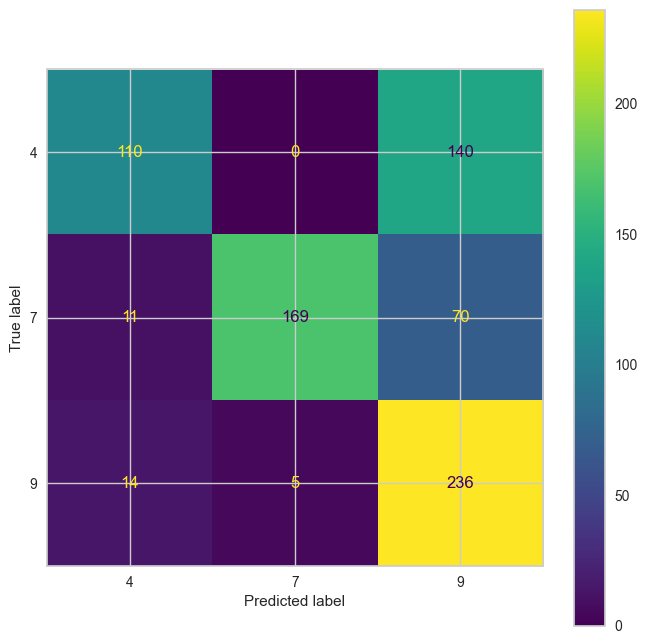

In [85]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(gnb_model, X_test_pca_s, y_test, display_labels=clases, ax=plt.subplot());

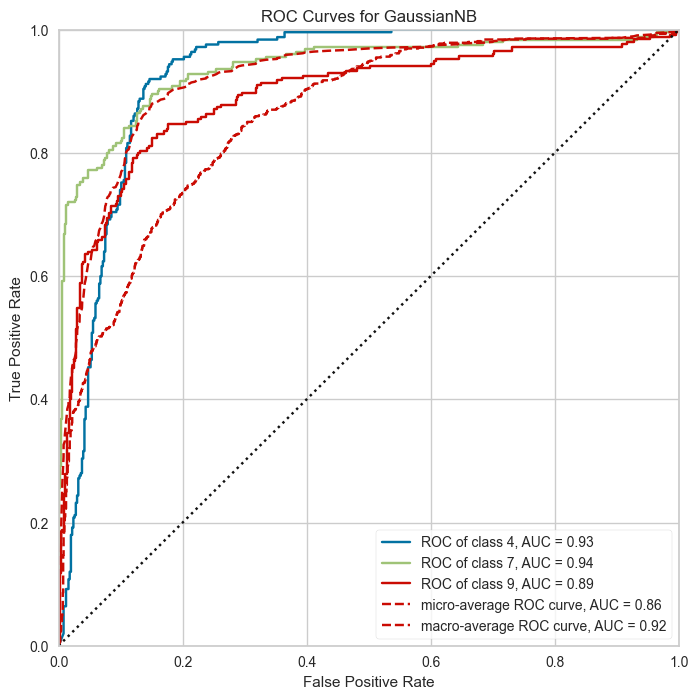

In [86]:
plt.figure(figsize=(8,8));
roc_auc(gnb_model, X_train_pca_s, y_train, X_test_pca_s, y_test);

Vemos que tenemos una mejor media i que la AUC de la clase del 9 es significativamente mucho mejor, ja que hemos pasado de una AUC=0.68 a una AUC=0.89. Además tenemos una mejor media, pasando de ser un 0.85 a un 0.92.

### Naïve Bayes Bernoulli

In [87]:
X_train_bin = Binarizer(threshold=0.5).transform(X_train_copia)
X_test_bin  = Binarizer(threshold=0.5).transform(X_test_copia)

X_train_bin.shape, X_test_bin.shape

((4514, 784), (755, 784))

In [88]:
X_train_bin = pd.DataFrame(X_train_bin)
X_test_bin = pd.DataFrame(X_test_bin)

X_train_bin.shape, X_test_bin.shape

X_train_bin_2 = X_train_bin.copy()
X_test_bin_2 = X_test_bin.copy()

In [89]:
X_train_standarized_bin = X_train_bin_2.copy()
X_test_standarized_bin = X_test_bin_2.copy()

myPCA = PCA().fit(X_train_standarized_bin[data_columns]);

transformed_train_bin = myPCA.transform(X_train_standarized_bin[X_train_bin_2.columns])
transformed_test_bin = myPCA.transform(X_test_standarized_bin[X_test_bin_2.columns])

nc = 100
X_train_pca_todas_bin = scaler.fit_transform(transformed_train_bin[:,:])
X_train_pca_s_bin = scaler.fit_transform(transformed_train_bin[:,:nc])
X_test_pca_s_bin = scaler.transform(transformed_test_bin[:,:nc])

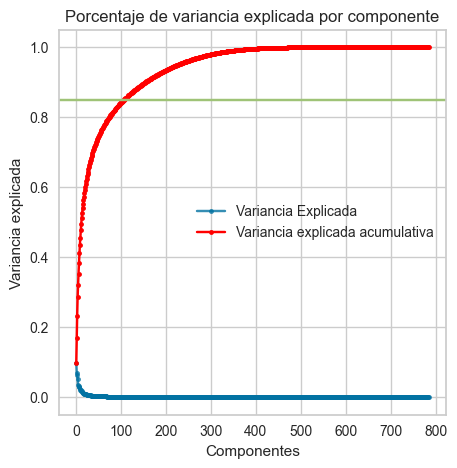

In [90]:
fig = plt.figure(figsize=(5,5));
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),myPCA.explained_variance_ratio_ ,alpha=0.8,marker='.',label="Variancia Explicada");
y_label = plt.ylabel('Variancia explicada');
x_label = plt.xlabel('Componentes');
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),
         np.cumsum(myPCA.explained_variance_ratio_),
         c='red',marker='.',
         label="Variancia explicada acumulativa");
plt.legend();
plt.title('Porcentaje de variancia explicada por componente');
plt.axhline(y=0.85, color='g', linestyle='-')

In [91]:
bnb = BernoulliNB()
print(np.mean(cross_val_score(bnb, X_train_pca_todas_bin, y_train, cv=10)))
print(np.mean(cross_val_score(bnb, X_train_pca_s_bin, y_train, cv=10)))

0.8055020308851519
0.7753625179051469


1 0.45192247316680734
2 0.4951288189470793
3 0.6612684692816357
4 0.6612684692816357
5 0.6672522222004199
6 0.6650388517159507
7 0.6712404097090046
8 0.680988167886506
9 0.708227537625336
10 0.7532042854620018
11 0.7518778329376213
12 0.7521015246355198
13 0.7543193100877107
14 0.7534328826795911
15 0.7649480996016718
16 0.7649476090497027
17 0.7631786786492161
18 0.7640636344014284
19 0.7647312756313404
20 0.7682730608480662
21 0.7660587092596589
22 0.7700459156643055
23 0.7713758020524695
24 0.7700459156643055
25 0.7727047073366953
26 0.7724844495025802
27 0.7735891725369386
28 0.7749180778211644
29 0.7769121715754567
30 0.7746973294350803
31 0.7764721464591959
32 0.776473127563134
33 0.7722627200125581
34 0.7753610462492396
35 0.7749215116849478
36 0.7751427506230011
37 0.7760291780311206
38 0.7727066695445715
39 0.7735930969526912
40 0.7716014559582443
41 0.7720439338343504
42 0.7698300727979122
43 0.7696063811000137
44 0.7700493495280891
45 0.7693871043698369
46 0.7720458960422267

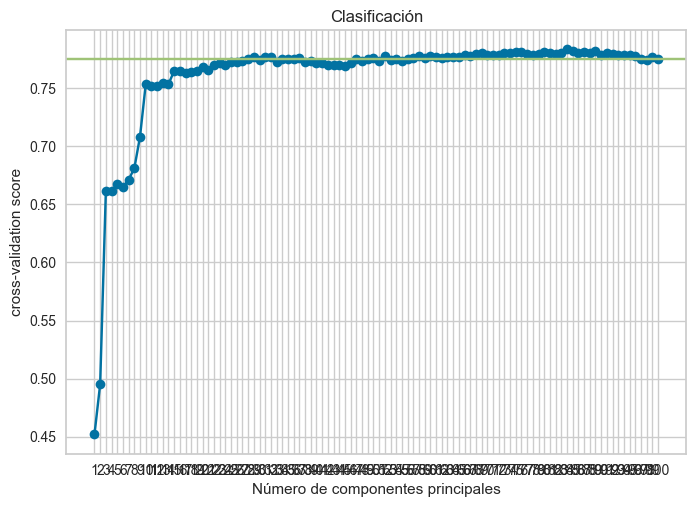

In [92]:
# NB Bernoulli k components matriu sense binaritzar
_list = []

for i in range(1, X_train_pca_s_bin.shape[1]+1):
    score = cross_val_score(bnb, X_train_pca_s_bin[:,:i], y_train, cv=10).mean()
    print(i, score)
    _list.append(score)
    
plt.plot(_list, '-o')
plt.xlabel('Número de componentes principales')
plt.ylabel('cross-validation score')
plt.title('Clasificación')
plt.xticks(np.arange(X_train_pca_s_bin.shape[1]), np.arange(1, X_train_pca_s_bin.shape[1]+1))
plt.axhline(y = np.mean(cross_val_score(bnb,X_train_pca_s_bin,y_train,cv=10)), color='g', linestyle='-');

Podemos ver que a partir de las 20/22 componentes nuestro score se mantiene, y va oscilando levemente, en este caso, podemos notar que para conseguir un mayor score, vamos a necesitar de todas las componentes, sino tendremos un acuracy claramente inferior al que teníamos sin la reducción de las componentes.

### Evaluamos la calidad del modelo para una NB Bernoulli

In [93]:
bnb_model = BernoulliNB().fit(X_train_pca_s_bin, y_train)

In [94]:
print(classification_report(bnb_model.predict(X_test_pca_s_bin), y_test, target_names=clases))

              precision    recall  f1-score   support

           4       0.70      0.85      0.77       206
           7       0.82      0.82      0.82       252
           9       0.84      0.72      0.78       297

    accuracy                           0.79       755
   macro avg       0.79      0.80      0.79       755
weighted avg       0.80      0.79      0.79       755



Notamos que todas la relaciones precision-recall se han visto afectadas. Ahora si que necesitamos de muchas mas componentes, nos faltaran componentes que no esten correlacionadas para augmentar el acierto del modelo.

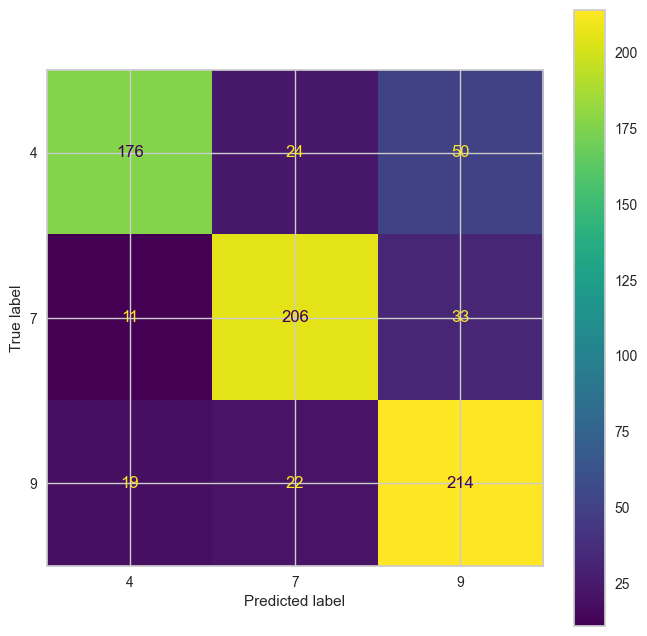

In [95]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(bnb_model, X_test_pca_s_bin, y_test, display_labels=clases, ax=plt.subplot());

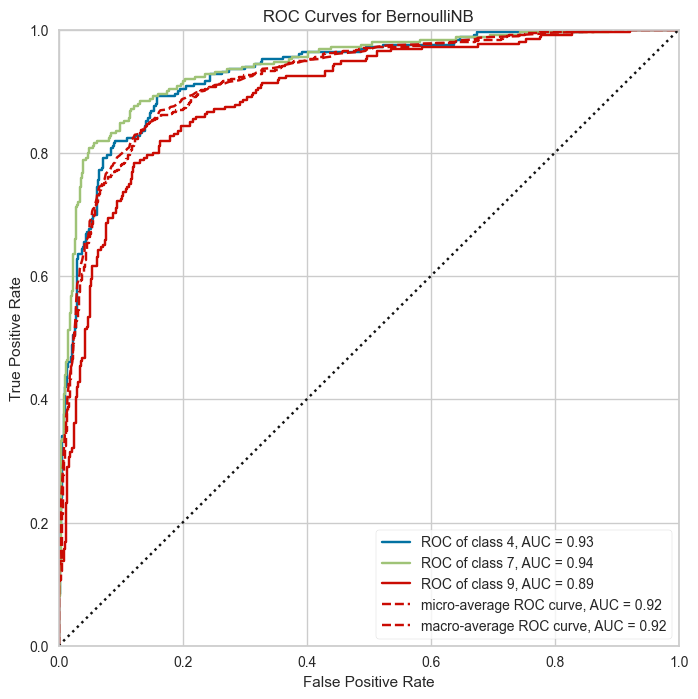

In [96]:
plt.figure(figsize=(8,8));
roc_auc(bnb_model, X_train_pca_s_bin, y_train, X_test_pca_s_bin, y_test);

Como es de esperar, todas la AUC han disminuido.

### KNN con la matriz original de datos 

In [97]:
X_train_standarized = X_train_copia.copy()
X_test_standarized = X_test_copia.copy()

scaler = MinMaxScaler()

X_train_standarized[data_columns] = scaler.fit_transform(X_train_copia[data_columns])
X_test_standarized[data_columns] = scaler.transform(X_test_copia[data_columns])

myPCA = PCA().fit(X_train_standarized[data_columns]);

transformed_train = myPCA.transform(X_train_standarized[X_train_copia.columns])
transformed_test = myPCA.transform(X_test_standarized[X_train_copia.columns])

nc = 30
X_train_pca_todas = scaler.fit_transform(transformed_train[:,:])

X_train_pca_s = scaler.fit_transform(transformed_train[:,:nc])
X_test_pca_s = scaler.transform(transformed_test[:,:nc])

knn =  KNeighborsClassifier()

print(np.mean(cross_val_score(knn, X_train_pca_todas, y_train, cv=10)))
print(np.mean(cross_val_score(knn, X_train_pca_s, y_train, cv=10)))

0.8101465769283598
0.9667695190628495


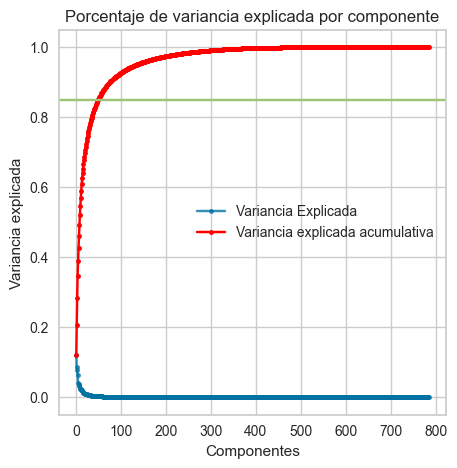

In [98]:
fig = plt.figure(figsize=(5,5));
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),myPCA.explained_variance_ratio_ ,alpha=0.8,marker='.',label="Variancia Explicada");
y_label = plt.ylabel('Variancia explicada');
x_label = plt.xlabel('Componentes');
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),
         np.cumsum(myPCA.explained_variance_ratio_),
         c='red',marker='.',
         label="Variancia explicada acumulativa");
plt.legend();
plt.title('Porcentaje de variancia explicada por componente');
plt.axhline(y=0.85, color='g', linestyle='-')

1 0.42289307929282033
2 0.564242685870141
3 0.7556506681317818
4 0.7957449522202382
5 0.8460314345701784
6 0.8568824441261308
7 0.875933520397151
8 0.894538194376312
9 0.9069481780899868
10 0.9293256872633087
11 0.9339731766183309
12 0.9421747149893059
13 0.9457199340698154
14 0.9514790141867631
15 0.9536963090869847
16 0.9559126228832682
17 0.9554696544551928
18 0.9579072071895297
19 0.9601191060180915
20 0.9583501756176049
21 0.9612287345721405
22 0.9601245020897513
23 0.9621166336361675
24 0.9607857661440654
25 0.9618924513863
26 0.9630010988364107
27 0.9625586209603044
28 0.9647739536526501
29 0.9665463179169201
30 0.9667695190628495


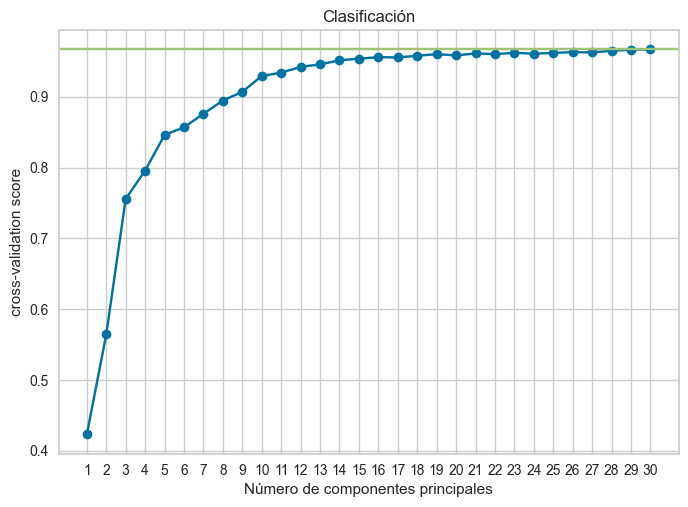

In [115]:
# KNN k components matriu sense binaritzar
_list = []

for i in range(1, X_train_pca_s.shape[1]+1):
    score = cross_val_score(knn, X_train_pca_s[:,:i], y_train, cv=10).mean()
    print(i, score)
    _list.append(score)
    
plt.plot(_list, '-o')
plt.xlabel('Número de componentes principales')
plt.ylabel('cross-validation score')
plt.title('Clasificación')
plt.xticks(np.arange(X_train_pca_s.shape[1]), np.arange(1, X_train_pca_s.shape[1]+1))
plt.axhline(y = np.mean(cross_val_score(knn,X_train_pca_s,y_train,cv=10)), color='g', linestyle='-');

Podemos ver que con aproximadamente 30 componentes tenemos un muy buen acierto

### Evaluamos la calidad del modelo para una KNN con la matriz de datos sin binarizar

In [100]:
param = {'n_neighbors':[1, 2, 3, 4, 5, 6, 7, 9, 11, 13, 15], 
          'weights':['distance', 'uniform'], 
          'leaf_size':[1, 5, 10, 20, 25, 30],
          'metric': ['l2', 'l1', 'cosine']}

knn_gs =  GridSearchCV(knn,param,cv=10, n_jobs=-1)
knn_gs.fit(X_train_pca_s, y_train);

/usr/local/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



In [101]:
show_html(pd.DataFrame(knn_gs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

,params,mean_test_score,rank_test_score
54,"{'leaf_size': 1, 'metric': 'cosine', 'n_neighbors': 6, 'weights': 'distance'}",0.973194,1
252,"{'leaf_size': 20, 'metric': 'cosine', 'n_neighbors': 6, 'weights': 'distance'}",0.973194,1
186,"{'leaf_size': 10, 'metric': 'cosine', 'n_neighbors': 6, 'weights': 'distance'}",0.973194,1
120,"{'leaf_size': 5, 'metric': 'cosine', 'n_neighbors': 6, 'weights': 'distance'}",0.973194,1
318,"{'leaf_size': 25, 'metric': 'cosine', 'n_neighbors': 6, 'weights': 'distance'}",0.973194,1


In [102]:
print(classification_report(knn_gs.predict(X_test_pca_s), y_test,target_names=clases))

              precision    recall  f1-score   support

           4       0.98      0.99      0.98       246
           7       0.98      0.98      0.98       250
           9       0.98      0.96      0.97       259

    accuracy                           0.98       755
   macro avg       0.98      0.98      0.98       755
weighted avg       0.98      0.98      0.98       755



Vemos que al aplicar la reducción, el modelo de KNN funciona un 0.01 mejor, no es ningun cambio significativo, pero hemos conseguido mejorar un poco el modelo, teniendo todas la relaciones precision-recall superiores a las que teníamos antes. Vemos que para la clase del 4, no se confunde con el 7.

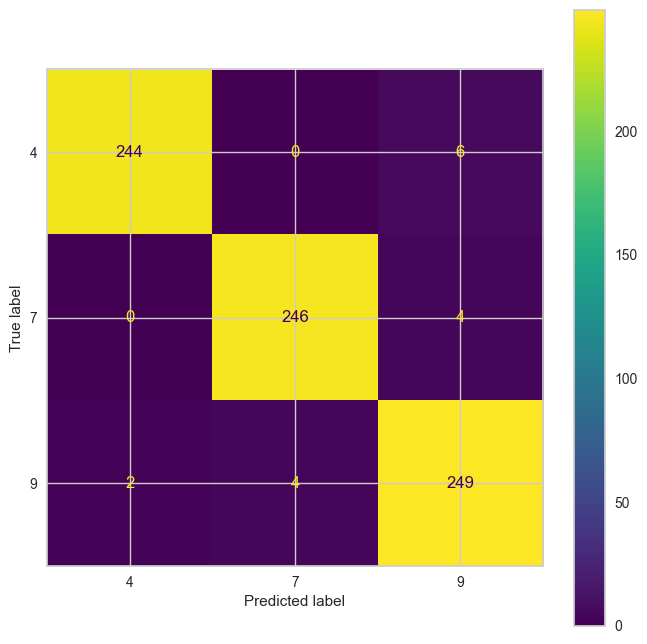

In [103]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(knn_gs, X_test_pca_s, y_test, display_labels=clases, ax=plt.subplot());

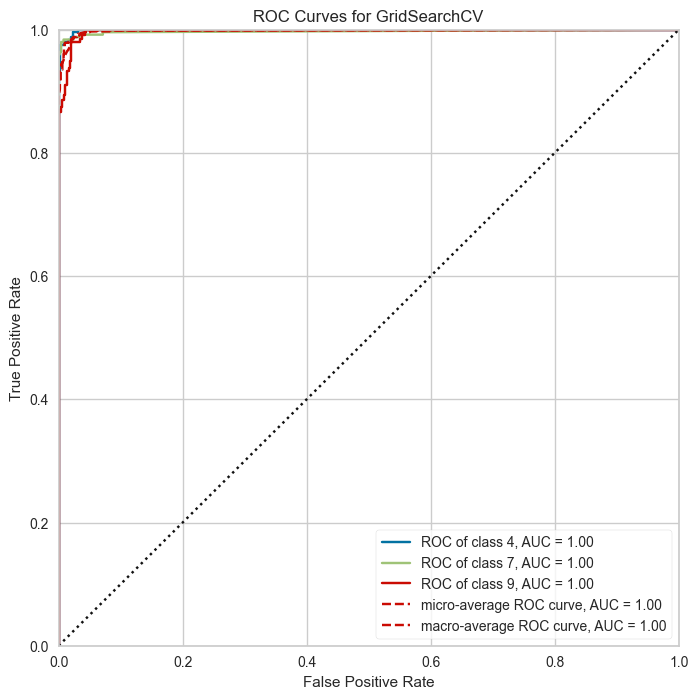

In [104]:
plt.figure(figsize=(8,8));
roc_auc(knn_gs, X_train_pca_s, y_train, X_test_pca_s, y_test);

Como podemos ver obtenenemos un AUC perfecta para todas las clases. Por lo tanto, para cualesquiera clase, tenemos un 100% de predicciones correctas.

### KNN con la matriz datos binarizada 

In [105]:
X_train_bin = Binarizer(threshold=0.5).transform(X_train_copia)
X_test_bin  = Binarizer(threshold=0.5).transform(X_test_copia)

X_train_bin.shape, X_test_bin.shape

((4514, 784), (755, 784))

In [106]:
X_train_bin = pd.DataFrame(X_train_bin)
X_test_bin = pd.DataFrame(X_test_bin)

X_train_bin.shape, X_test_bin.shape

X_train_bin_2 = X_train_bin.copy()
X_test_bin_2 = X_test_bin.copy()

In [107]:
X_train_standarized_bin = X_train_bin_2.copy()
X_test_standarized_bin = X_test_bin_2.copy()

myPCA = PCA().fit(X_train_standarized_bin[data_columns]);

transformed_train_bin = myPCA.transform(X_train_standarized_bin[X_train_bin_2.columns])
transformed_test_bin = myPCA.transform(X_test_standarized_bin[X_test_bin_2.columns])

nc = 30
X_train_pca_todas_bin = scaler.fit_transform(transformed_train_bin[:,:])
X_train_pca_s_bin = scaler.fit_transform(transformed_train_bin[:,:nc])
X_test_pca_s_bin = scaler.transform(transformed_test_bin[:,:nc])

knn =  KNeighborsClassifier()

print(np.mean(cross_val_score(knn, X_train_pca_todas_bin, y_train, cv=10)))
print(np.mean(cross_val_score(knn, X_train_pca_s_bin, y_train, cv=10)))

0.7826923454270746
0.9632301866059689


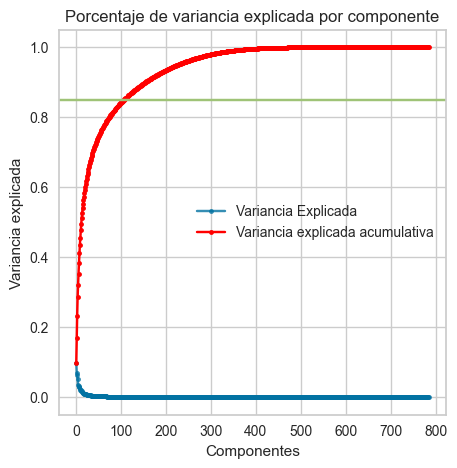

In [108]:
fig = plt.figure(figsize=(5,5));
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),myPCA.explained_variance_ratio_ ,alpha=0.8,marker='.',label="Variancia Explicada");
y_label = plt.ylabel('Variancia explicada');
x_label = plt.xlabel('Componentes');
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),
         np.cumsum(myPCA.explained_variance_ratio_),
         c='red',marker='.',
         label="Variancia explicada acumulativa");
plt.legend();
plt.title('Porcentaje de variancia explicada por componente');
plt.axhline(y=0.85, color='g', linestyle='-')

1 0.43088466142103093
2 0.5573744677511134
3 0.7396969369935051
4 0.7802317367501913
5 0.8453608500284518
6 0.856890783509605
7 0.8723863391087653
8 0.8914369248278163
9 0.9082814983419343
10 0.9295459450974235
11 0.9315434727154995
12 0.9426167023134429
13 0.9430621235013638
14 0.9477140278241076
15 0.9499303416203911
16 0.9457218962776917
17 0.9499308321723603
18 0.9497086121303691
19 0.9525886427408121
20 0.9501501089025371
21 0.9539165669210995
22 0.9525886427408119
23 0.9550296293389321
24 0.9579081882934679
25 0.9568000313953261
26 0.9585728862115653
27 0.9574676726252379
28 0.9596820242136452
29 0.9621185958440439
30 0.9632301866059689


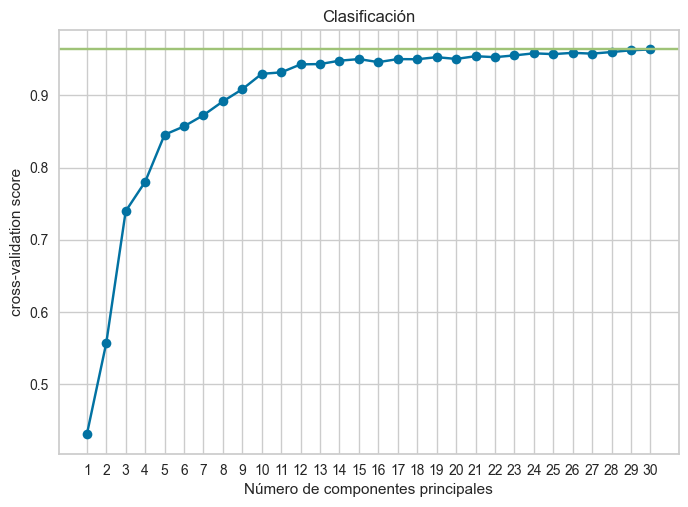

In [109]:
# NB Bernoulli k components matriu sense binaritzar
_list = []

for i in range(1, X_train_pca_s_bin.shape[1]+1):
    score = cross_val_score(knn, X_train_pca_s_bin[:,:i], y_train, cv=10).mean()
    print(i, score)
    _list.append(score)
    
plt.plot(_list, '-o')
plt.xlabel('Número de componentes principales')
plt.ylabel('cross-validation score')
plt.title('Clasificación')
plt.xticks(np.arange(X_train_pca_s_bin.shape[1]), np.arange(1, X_train_pca_s_bin.shape[1]+1))
plt.axhline(y = np.mean(cross_val_score(knn,X_train_pca_s_bin,y_train,cv=10)), color='g', linestyle='-');

Vemos que usando 30 componentes nos es suficiente para alanzar una buen cross-validation score

### Evaluamos la calidad del modelo para una KNN con la matriz de datos binarizada

In [110]:
param = {'n_neighbors':[1, 2, 3, 4, 5, 6, 7, 9, 11, 13, 15], 
          'weights':['distance', 'uniform'], 
          'leaf_size':[1, 5, 10, 20, 25, 30],
          'metric': ['l2', 'l1', 'cosine']}

knn_gs =  GridSearchCV(knn,param,cv=10, n_jobs=-1)
knn_gs.fit(X_train_pca_s_bin, y_train);

In [111]:
show_html(pd.DataFrame(knn_gs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

,params,mean_test_score,rank_test_score
210,"{'leaf_size': 20, 'metric': 'l2', 'n_neighbors': 7, 'weights': 'distance'}",0.966107,1
78,"{'leaf_size': 5, 'metric': 'l2', 'n_neighbors': 7, 'weights': 'distance'}",0.966107,1
342,"{'leaf_size': 30, 'metric': 'l2', 'n_neighbors': 7, 'weights': 'distance'}",0.966107,1
144,"{'leaf_size': 10, 'metric': 'l2', 'n_neighbors': 7, 'weights': 'distance'}",0.966107,1
12,"{'leaf_size': 1, 'metric': 'l2', 'n_neighbors': 7, 'weights': 'distance'}",0.966107,1


In [112]:
print(classification_report(knn_gs.predict(X_test_pca_s_bin), y_test,target_names=clases))

              precision    recall  f1-score   support

           4       0.97      0.98      0.98       248
           7       0.98      0.96      0.97       255
           9       0.95      0.96      0.95       252

    accuracy                           0.96       755
   macro avg       0.96      0.96      0.96       755
weighted avg       0.96      0.96      0.96       755



Apenas hay diferencias de este modelo con el mismo que habíamos relalizado anteriormente. Solo diferencias no sustanciales en el mean_test_score, puesto que este ha disminuido un poco.

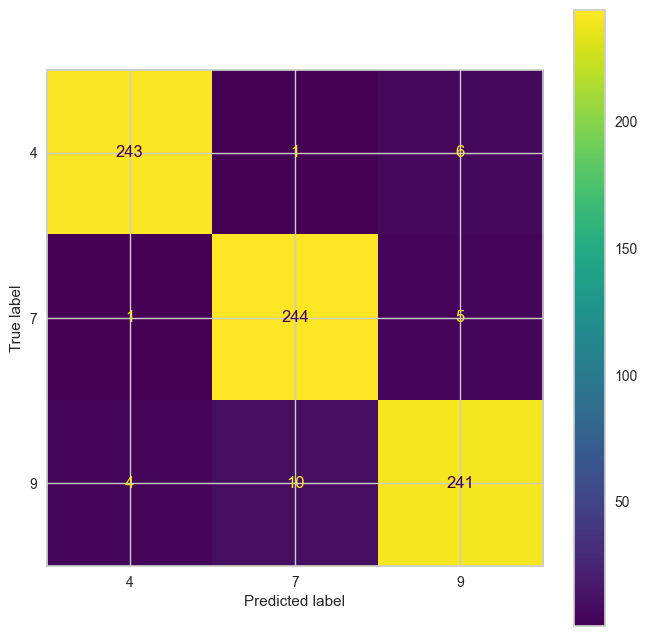

In [113]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(knn_gs, X_test_pca_s_bin, y_test, display_labels=clases, ax=plt.subplot());

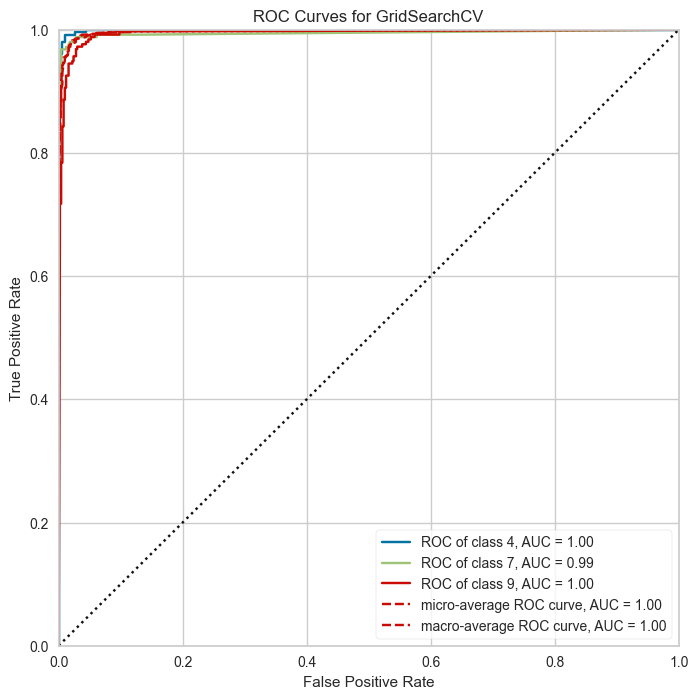

In [114]:
plt.figure(figsize=(8,8));
roc_auc(knn_gs, X_train_pca_s_bin, y_train, X_test_pca_s_bin, y_test);

### ¿Por qué sería más adecuado usar el Naïve Bayes con esta transformación?

Usar Naïve Bayes Gausiano con un cierto número de componentes es mucho más adecuado que usar cualesquiera de los modelos de KNN con la transformación que les hemos aplicado. Esto es así ya que la relación de calidad/tiempo de los modelos de KNN comparada con los modelos de NB es mucho peor. Para conseguir una buena calidad en KNN necesitamos mucho más tiempo que para los modelos de NB auqnue estos tengas una accuracy inferior. Aún así, vemos que estos el modelo de NB Gausiano, al escoger un cierto número de componentes con respecto a cuando cogíamos todas las componentes ha mejorado, y por otro lado, la acuracy del modelo de NB Bernoulli ha disminuido.

Determinar el número de componentes es crucial ya que al usar PCA para la reducción de dimensionalidad, hemos de determinar con acierto el número de dimensiones (la proporción de la varianza original) que queremos dejar en los datos. 

Si no reducimos la dimensionalidad lo suficiente, no filtraremos el ruido y pasará que a medida que añadimos compoentes en NB Gausiano tendremos un peor score. Por otro lado, si eliminamos demasiadas dimensiones, corremos el riesgo de eliminar información valiosa, como sucede en NB Bernoulli.

Usar KNN con esta transformación es más asequible, pero no nos hará tener un clasificador de códigos postales bueno para una predicción en tiempo real ya que es demasiado costoso, aunque haga un 100% de predicciones correctas. Usar un NB que no nos de esta fiabilidad pero si rapidez, nos hace más eficientes.

-----------

Vemos que a NB Gausiano a medida que augmentamos el número de componentes solo empeora, ya que tenemos píxeles que están en cierta forma correlacionados y no son independientes. Al tener esta cantidad de features, podríamos probar de usar una SVM pero alomejor nos cuesta encontrar un poco el kernel correcto, podemos apostar por uno no-lineal, ya que al ver el resultado que nos ha dado el t-SNE, podemos intuir que entre nuestros datos tenemos no-linealidades.

Comprobación aquí: [SVM al subconjunto MNIST](SVM%20al%20subconjunto%20MNIST.ipynb)

### ¿Qué ventajas/inconvenientes tendría el trabajar con los datos transformados?

Vemos que trabajando con los datos transformados, i.e con menor dimensionalidad, el hecho de poder ajustar los modelos KNN se vuelve más practicable para este caso práctico ya que el tiempo de ejecución se ha reducido considerablemente y la precisión no se ha visto perjudicada, por lo tanto vemos que reduciendo la dimensionalidad hace que los modelos KNN funcionen de forma más eficiente y manteniendo la calidad que tenían cuando usábamos todos los píxeles de las imágenes. Vemos que solamente usando 30 componentes tenemos suficente para llegar a la misma calidad que cúando usábamos las 784.

Por otro lado, también vemos que transformando los datos, después de la aplicación del PCA y quedándonos solo con 30 componentes la accuracy del modelo de NB Gausiano ha mejorado de forma significativa, pasando de un 0.57 a un 0.68. A medida que ibámos añadiendo más componentes podíamos ver que la $R^{2}$ del conjunto de validación disminuia. Esto se debe a que en realidad la asunción de que los píxeles son independientes no es corercta, ya que algunos si que estan altamente correlacionadas y no son independientes. Además el PCA tampoco nos ha funcionado demasiado ya que pondera cada pixel por igual y no tiene en cuenta la clase.

Además un inconveniente es que para el modelo de NB Bernouilli, ha sido arriesgado realizar esta reducción de dimensionalidad, ya que hemos perdido información valiosa y nos ha derivado en un peor clasificador.

En general pero, trabajamos con menos dimensiones, y esto siempre nos viene bien ya que el tiempo de cómputo va a dismuinir, y también la practicabilidad a la hora de gestionar un recurso como es la memoria donde cargaremos el modelo. 

### ¿Qué modelo de entre todos elegirías para reconocer códigos postales? Razona tu respuesta.

Para razonar qué modelo de entre los cuatro escogeria para reconocer los códigos postales que se encuentran cartas, tendré en cuenta varios factores que me parecen cruciales para la elección. 

Para saber cuáles son factores, hemos de retroceder al enunciado y fijarnos en el hecho de que se nos dice de forma indirecta que queremos: 

* clasificar las cartas en el **menor tiempo possible** ya que hacerlo a mano consume demasiado tiempo
* hacer la clasificación de **manera fiable**, puesto que hacerlo a mano no lo es del todo y además es cansado

Por lo tanto, nuestra elección del modelo estará estrechamente condicionada por los dos factores de arriba. Así pues, tendremos que escoger un modelo que tenga un equilibrio de ambos, es decir, que no tarde mucho en dar la clasificación y que lo haga relativamente bien, es decir que nos podamos fiar de la clasificación que hace de los códigos para todas las cartas. 

Lo que hemos de interpretar del enunciado es que lo que realmente queremos es dar una **predicción en tiempo real** de los códigos postales para clasificar las cartas que nos lleguen. Esta predicción en tiempo real, ha de ser lo más rápida y fiable posible.

Hemos visto que los distintos modelos tienen una $R^{2}$ distinta, podemos verlas como siguen:
* Naïve Bayes Gausiano: **0.57**
* Naïve Bayes Bernoulli: **0.86**
* KNN matriz datos original: **0.97**
* KNN matriz datos binarizada: **0.96**

Además estas $R^{2}$ se han obtenido sin hacer aún la reducción de la dimensionalidad para posteriormente pasarlo a los modelos, es decir sin usar los componentes de PCA para reducir las dimensiones y ver como ha afectado a la calidad del resultado.

Como podemos ver hay una gran diferencia entre las $R^{2}$ del modelo de **Naïve Bayes Gausiano** y el resto de modelos.

Una vez realizada la transformación, hemos elegido un número de componentes, **nc=30** y hemos obtenido las matrices de datos transformadas. Una vez ajustados los nuevos modelos, tenemos las $R^{2}$, como siguen:
* Naïve Bayes Gausiano: **0.68**
* Naïve Bayes Bernoulli: **0.79**
* KNN matriz datos original: **0.98**
* KNN matriz datos binarizada: **0.96**

Además también hay una diferencia considerable entre el tiempo de ejecución entre los modelos de **Naïve Bayes** y los **KNN**

Tenemos por un lado que el tiempo de ejecución de los **Naïve Bayes** es $\Theta(1)$ mientras que lo mejor que lo pueden hacer los modelos de **KNN** basados en KDTree es $\Theta(log(N))$, siendo N el numero de data points que tengamos. Por lo tanto como más grande sea el tamaño de los datos aplicar un KNN se vuelve un poco impracticable si no le aplicamos alguna reducción o alguna tuneada importante en los hiperparámetros.

Por lo tanto, los modelos KNN funcionan mejor cuando los datos son pequeños, pero si sabemos que el tamaño de nuestros datos es grande o va aumentando, seria aconsejable elegir unos modelos de Naive Bayes. 

Aunque, KNN a veces puede ser una buena opción en algunos entornos, especialmente si los datos que tenemos tiene baja dimensión o si les aplicamos una reducción de dimensionalidad, vemos que usar KNN para clasificación de imágenes es un poco impracticable, por el tiempo de ejecución, ya que por el contrario son los modelos que mejor fiabilidad tienen, ya que producen mejores resultados que Naïve Bayes. Pero el problema es que las imágenes suelen tener grandes dimensiones, i.e pueden contener muchos píxeles.

Por lo tanto, hemos visto que sin aplicar la transformación a los datos, quedarnos con alguno de los modelos de KNN seria inviable ya que el tiempo de ejecución de estos no nos permitiria poder clasificar los códigos postales de las cartas de forma rápida, aunque si de forma muy fiable.

Dada esta situación, y después de aplicar la transformación del PCA a las matrices de datos, y quedándonos con solo 30 componentes, hemos podido ver que el tiempo de ejecución de los modelos KNN es menor, aunque sigue siendo demasiado alta en comparación con los modelos de Naïve Bayes.

Es por esto que creo que la mejor opción seria tener como clasificador al modelo de **NB Bernoulli sin la reducción de dimensionalidad**. Este modelo funciona mejor que el Naïve Bayes en ambos casos(sin y con transformación) además en tiempo de ejecución va a la par que el modelo de NB Gausiano. El ~10% más de acuracy que nos dan los modelos KNN con respecto a este, no nos compensa, ya que debemos ser eficientes a la hora de clasificar las cartas, puesto que no seria rentable clasificar menos cartas pero de forma segura a, más cartas, y con solo un ~10% de clasificaciones erróneas. El servicio de correos preferiria asumir este coste extra surgido de la mala clasifiación a ser menos eficiente en tiempo. 

Si el servicio de correos estuviese dispuesto a asumir un coste un poco superior, alomejor podria plantearse usar el método de **KNN con la matriz sin binarizar y con la reducción de la dimensionalidad**. 